<h1><font color='blue'>Projet 6 : Classifiez automatiquement des biens de consommation</h1>

Le but de ce projet est de réaliser une première étude de faisabilité d'un moteur de classification d'articles pour une marketplace e-commerce. L'étude sera basée sur l'image et la description d'article pour l'automatisation de l'attribution de la catégorie de l'article.

Voici les contraintes : 

Afin d’extraire les features **texte**, il sera nécessaire de mettre en œuvre :
- Deux approches de type “bag-of-words”, comptage simple de mots et Tf-idf 
- Une approche de type word/sentence embedding classique avec Word2Vec (ou Glove ou FastText) 
- Une approche de type word/sentence embedding avec BERT 
- Une approche de type word/sentence embedding avec USE (Universal Sentence Encoder)
  
Afin d’extraire les features **image**, il sera nécessaire de mettre en œuvre :
- Un algorithme de type SIFT / ORB / SURF ;
- Un algorithme de type CNN Transfer Learning.

# <font color="blue">Sommaire</font> 
1- [Mise en place de l'environnement python](#section_1)       
2- [Importer la base de données et vue globale](#section_2)     
3- [Partie texte](#section_3)     
3-1 [Pré-traitement](#section_3_1)    
       3-2 [Bag Of Word](#section_3_2)      
3-2-1 [Countvectorizer](#section_3_2_1)      
 3-2-2 [Tf-idf](#section_3_2_2)    
    3-3 [Word Embedding](#section_3_3)         
       3-3-1 [Word2Vec](#section_3_3_1)  
       3-3-2 [Bidirectional Encoder Representations from Transformers BERT](#section_3_3_2)    
       3-3-3 [Universal Sentence Encoder USE](#section_3_3_3)     
4- [Partie visuelle](#section_4)           
    4-1 [Pré-traitement](#section_4_1)    
    4-2 [Bag of Visual Words : Scale-Invariant Feature Transform SIFT](#section_4_2)   
    4-3 [Convolutional Neural Networks (CNN) transfer learning](#section_4_3)  
        4-3-1 [Vgg16](#section_4_3_1)  
        4-3-2 [InceptionV3](#section_4_3_2)        
5- [Combinaison des meilleurs résultats des approches texte et image](#section_5)                  
6- [Conclusion](#section_6)       

# <font color="blue" id="section_1"> 1- Mise en place de l'environnement python

In [524]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import re
import os

# nltk
import nltk
from string import punctuation
from nltk.corpus import stopwords
from nltk import word_tokenize, sent_tokenize         
from nltk.stem import WordNetLemmatizer 
from nltk.stem import PorterStemmer
from nltk import word_tokenize

# keras
import tensorflow as ft
from tensorflow import keras
#import tensorflow.keras
from keras import backend as K

# from keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
# from keras import metrics as kmetrics
from keras.layers import *
from keras.models import Model

import tensorflow as tf
import tensorflow.keras
# from tensorflow.keras import backend as K

# from tensorflow.keras.preprocessing.text import Tokenizer
# from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim



from tensorflow.keras.preprocessing.image import load_img, img_to_array

from keras.models import Sequential
# from keras.layers import Conv2D, MaxPooling2D
# from keras.layers import Flatten, Dense, Activation
# from keras.models import clone_model



from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

# normalisation, encoding

from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder

# reduction dimension et clustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

# Errors & Quality of prediction
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score
from sklearn.metrics import adjusted_rand_score, silhouette_score

from IPython.display import Image as Ig 
from IPython.display import display, Markdown

from scipy.spatial import distance
#from IPython.core.display import display, HTML

# Traitement images

import cv2
import PIL
from PIL import Image, ImageOps, ImageFilter
from scipy.ndimage import gaussian_filter

# Deep Learning & Transfer Learning

import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from keras.models import Model
from keras.layers import Dense, Flatten
from keras.applications.vgg16 import VGG16, preprocess_input


# import plotly.express as px
plt.rcParams.update({'font.size': 15})

# Warnings
import warnings
warnings.filterwarnings(action = 'ignore')


In [21]:
#Traitement des catégories

def split_categories(category, level):
    '''Fonction qui affiche les '''
    category = category.split('["')[1].split('"]')[0]
    cat = category.split(' >> ')
    if(len(cat)) < 3:
        cat = [cat[0], cat[1], 'None']
        if(len(cat))<2:
            cat = [cat[0], 'None', 'None']
    return cat[level]

def split_categories_1(category):
    return split_categories(category,0)
def split_categories_2(category):
    return split_categories(category,1)
def split_categories_3(category):
    return split_categories(category,2)

def df_categories_split(df):
    df['cat_lvl_1'] = df['product_category_tree'].apply(split_categories_1)
    df['cat_lvl_2'] = df['product_category_tree'].apply(split_categories_2)
    df['cat_lvl_3'] = df['product_category_tree'].apply(split_categories_3)
    return df.drop(['product_category_tree'], axis=1)

In [22]:
# fonction preparation et nettoyage text:

# remove stopwords

def remove_stopwords(text):
    ''' fct qui split le text, garde le mot qui n est pas dans stop_words set, 
        les rejoins again en laissant une espace entre eux'''
    stop_words = set(stopwords.words('english'))
    return " ".join([word for word in str(text).split() if word not in stop_words])    # retourne un string
     

    
# lemmatization
    
def lemmatize_words(text):
    lemmatizer = WordNetLemmatizer()
    return " ".join([lemmatizer.lemmatize(word) for word in text.split()])     # retourne un string
    
def Stem_words(text):
    
    ps = PorterStemmer()
    return " ".join([ps.stem(word) for word in text.split()])     # retourne un string

# fonction de preparation et nettoyage complet 

def prep_text(text, stemm=False, lemm=True) :
    '''Fonction qui pre-traite le texte avant de realiser un BOW. Elle permet de supprimer du texte
    les ponctuations, les stopwords, les chiffres et les mots avec chiffres et de le transformer en miniscule.
    Elle permet egalement au choix de faire une lemmatisation et/ou un stemming'''
    
    # remove punctuation
    text = text.apply(lambda x: re.sub('[%s]' % re.escape(punctuation), '' , x))
    # apply lower case
    text = text.apply(lambda x: x.lower())
    # remove words+digits and digits
    text = text.apply(lambda x: re.sub(r'\w*\d\w*','',x))
    # remove stop words    
    text = text.apply(lambda x: remove_stopwords(x)) 
    
    ## Stemming (remove -ing, -ly, ...)
    if stemm == True:
        text = text.apply(lambda text: Stem_words(text))
        
    # lemmatization     
    if  lemm == True:
        text = text.apply(lambda text: lemmatize_words(text))  
            
    return text
    
    
    

In [446]:
# fonction vectorisation  (TfidfVectorizer()) CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

def vect_vocab(text, vect_tool): 
    
    
    time1 = time.time()

    matrix = vect_tool.fit_transform(text)
    
    # create dataframe 

    df = pd.DataFrame(matrix.toarray(),columns=vect_tool.get_feature_names_out()) 
    vocab = vect_tool.vocabulary_
    print(f'il y a {len(vect_tool.vocabulary_)} vocabulaires')
#   print(vect_tool.vocabulary_)
    time2 = np.round(time.time() - time1,2)
    print("temps traitement : ", time2)
    
    return df, vocab

    
def vect_vocab_2text(text1, text2, vect_tool): 
    time1 = time.time()
    fit_name = vect_tool.fit(text1)
    
    matrix1 = fit_name.transform(text1)
    matrix2 = fit_name.transform(text2)
        
    # create dataframe 

    df1 = pd.DataFrame(matrix1.toarray(),columns=vect_tool.get_feature_names_out())   
    df2 = pd.DataFrame(matrix2.toarray(),columns=vect_tool.get_feature_names_out())         
    vocab = vect_tool.vocabulary_
    print(f'il y a {len(vect_tool.vocabulary_)} vocabulaires')
    time2 = np.round(time.time() - time1,2)
    print("temps traitement : ", time2)
    
    return df1, df2, vocab


In [719]:
# fonctions de reductions de dimensions ACP/TSNE et
# clustering kmeans et les visualisations correspondantes

def acp(df) :
    
    pca = PCA() 
    X_pca = pca.fit_transform(df)
    
    # Conversion en dataframe pandas
    pca_columns = ['PC' + str(c) for c in range(1, X_pca.shape[1]+1, 1)] 
    df_pca = pd.DataFrame(X_pca, index=df.index, columns=pca_columns) 
    
    # features pour 99% variance expliquee

    sum_pca = np.cumsum(pca.explained_variance_ratio_)
    for counter, value in enumerate(sum_pca):
        if value > 0.99:
            X_reduce = pca.transform(df)[:,:counter]
            break

    print(f"nombre de features après reduction ACP pour 99% de variance : {counter+1}")      
    
    # creation df pca 99 

    df_pca_99 = df_pca[df_pca.columns[0:counter+1]] 
      
    return df_pca_99


def tsne_red(df, perplex) :
    
 
    tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=perplex) # init pca fctionne pas avec matrice sparse
    X_tsne = tsne_red.fit_transform(df)
    
    columns = ['DIM' + str(c) for c in range(1, X_tsne.shape[1]+1, 1)]
    X_tsne = pd.DataFrame(X_tsne, index=df.index, columns=columns)
        
  
    return X_tsne
    
# kmeans

def kmeans(df, df_categories):
    
    df_c = df.copy()
    
    model = KMeans(n_clusters=7, random_state=0)
    
    model = model.fit(df_c)
    
   
    labels = model.labels_

    silhouette_coeff = round(silhouette_score(df_c, labels), 4)
    
    df_c['cluster_id'] = labels
    df_c['categories'] = df_categories
    
    #####    
    # encoder les categories
    lab_encod = LabelEncoder()
    df_c["label"] = lab_encod.fit_transform(df_c["categories"])
#     cat_code = df_c["label"].to_list()
    ####
    
    # Indice de Rand ajusté :

    ARI = round(adjusted_rand_score(df_c.cluster_id, df_c.categories), 4)

    print("-----------------------------------------")
    print(f" coefficient de silhouette : {silhouette_coeff}")
    print(f" ARI  : {ARI}")
    print("-----------------------------------------")
    
    return df_c, ARI, labels


                 
# visualisation du Tsne selon les vraies catégories et selon les clusters
# (source notebook exemple nlp)

def TSNE_visu_fct(X_tsne, labels, ARI) :
    fig = plt.figure(figsize=(20,10))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne.iloc[:,0],X_tsne.iloc[:,1], c=cat_code, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=list_cat, title="Categorie", loc="best", fontsize=8) #loc="upper left"
    plt.title(f'Représentation des catégories par catégories réelles\n ARI : {ARI}', fontsize=20)
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne.iloc[:,0],X_tsne.iloc[:,1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels),  title="Clusters", loc="best", fontsize=8) 
    plt.title('Représentation des catégories par clusters', fontsize=20)    

In [417]:
# fonction qui encode les categories

def encode_cat(df):
    lab_encod = LabelEncoder()
    df["label"] = lab_encod.fit_transform(df["categories"])
    
    return df

def conf_mat(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    # creation dataframe
#     list_labels = df['categories'].sort_values().unique().tolist()
    df_cm = pd.DataFrame(conf_mat, index = [label for label in list_cat])
    
    #plot   
    plt.figure(figsize = (6,4))
    sns.heatmap(df_cm, annot=True, cmap="Blues", fmt='g')
    
def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    #print ("Correspondance des clusters : ", corresp)
    
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

def conf_mat_metrics(df):
    
      
    cls_labels_transform = conf_mat_transform(df["label"], df["cluster_id"])
    conf_mat = confusion_matrix(df["label"], cls_labels_transform)

    # creation dataframe
    list_labels = df['categories'].sort_values().unique().tolist()
    df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels])
    
    # plot   
    plt.figure(figsize = (6,4))
    sns.heatmap(df_cm, annot=True, cmap="Blues", fmt='g')
 
    # classification report accuracy, precision, recall
    report = classification_report(df["label"], cls_labels_transform, output_dict=True)
    df_report = pd.DataFrame(report).transpose()

    display(df_report)

# <font color="blue" id="section_2"> 2- Importer la base de données et Vue globale

In [9]:
df_txt = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

In [10]:
df_txt.shape

(1050, 15)

In [78]:
df_txt['product_specifications'][0]

'{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}'

In [11]:
df_txt.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [358]:
df_txt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

None

In [359]:
df_txt['product_name'][0]

'Elegance Polyester Multicolor Abstract Eyelet Door Curtain'

In [360]:
df_txt['description'][0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [361]:
df_txt['product_category_tree'][0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [12]:
df_txt['product_category_tree'].nunique()

642

In [17]:
df_txt['product_category_tree'].unique()[0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [28]:
df_split_cat = df_txt.copy()
split_cat = df_categories_split(df_split_cat)
split_cat.head(5)


,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets


In [29]:
split_cat['cat_lvl_1'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

In [30]:
split_cat.groupby('cat_lvl_1').size()

cat_lvl_1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
dtype: int64

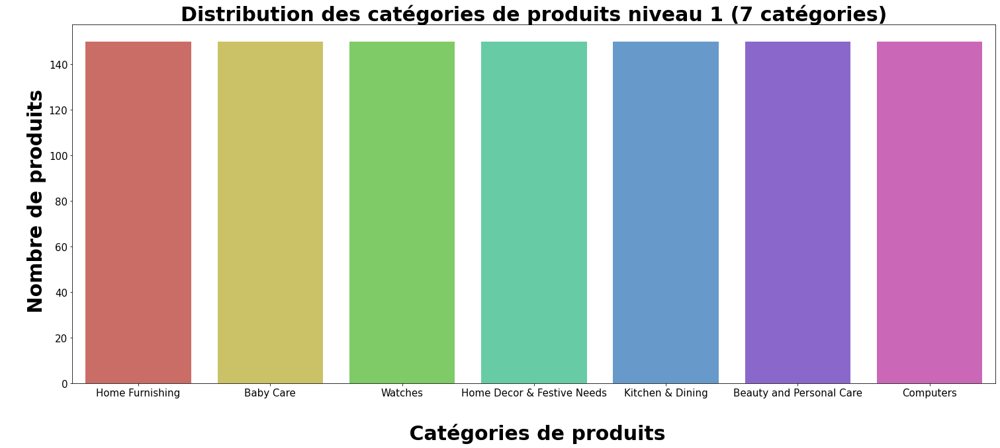

In [33]:
# Comptage des catégories produits (de niveau 1) sur le dataset

plt.figure(figsize=(25,10)) 
plt.title('Distribution des catégories de produits niveau 1 (7 catégories)', weight='bold', size=30)
sns.barplot(x = split_cat.groupby('cat_lvl_1', sort=False).size().index, 
            y = split_cat.groupby('cat_lvl_1').size(), 
            palette='hls')
plt.xlabel('\n Catégories de produits', weight='bold', size=30)
plt.ylabel('\n Nombre de produits', weight='bold', size=30)
plt.savefig('categories_lev1',dpi=200, bbox_inches='tight')
None
plt.show()

In [363]:
len(split_cat['cat_lvl_2'].unique())

62

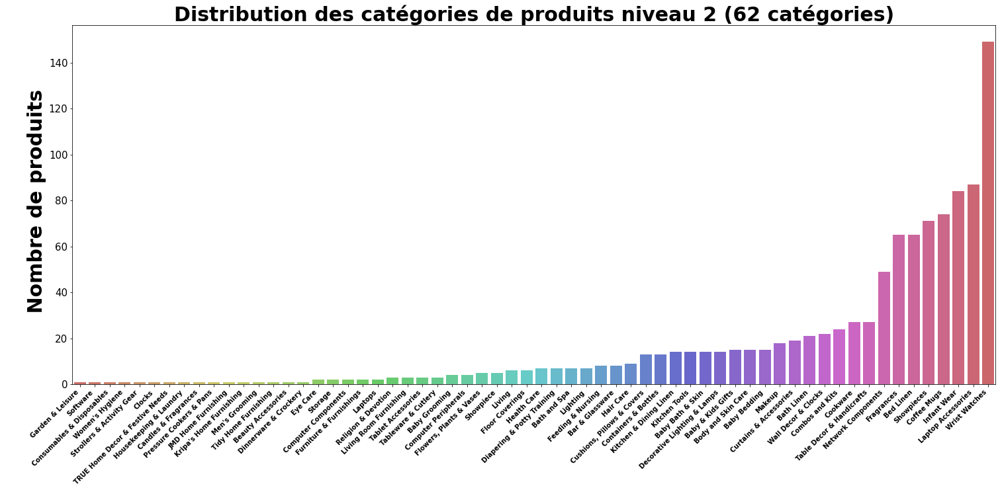

In [510]:
# Comptage des catégories produits (de niveau 2) sur le dataset

plt.figure(figsize=(25,10)) 
plt.title('Distribution des catégories de produits niveau 2 (62 catégories)', weight='bold', size=30)
sns.barplot(x = split_cat.groupby('cat_lvl_2').size().sort_values(ascending=True).index, 
            y = split_cat.groupby('cat_lvl_2').size().sort_values(ascending=True), 
            palette='hls')
plt.xticks(rotation = 45, ha = 'right', size = 10, weight = 'bold')
#plt.xlabel('\n Catégories de produits', weight='bold', size=30)
plt.xlabel('')
plt.ylabel('\n Nombre de produits', weight='bold', size=30)
plt.savefig(f'categories_lev2',dpi=200, bbox_inches='tight')
None
plt.show()

In [364]:
len(split_cat['cat_lvl_3'].unique())

242

In [381]:
cols = ['product_name', 'image', 'description', 'cat_lvl_1']
df_cat = split_cat[cols].rename(columns = {'cat_lvl_1' : 'categories'})
list_cat = df_cat['categories'].sort_values().unique().tolist()
# Encoder catégories
df_cat = encode_cat(df_cat)
cat_code = df_cat["label"].to_list()

print(list_cat)


['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']


# <font color="blue" id="section_3"> 3- Partie texte

### Variable 'Description'

In [382]:
# La longueur des descriptions produits

description_length = []

for i in df_cat['description']:    
    description_length.append(len(i))

In [241]:
from statistics import median, mean
mean(description_length)

473.8209523809524

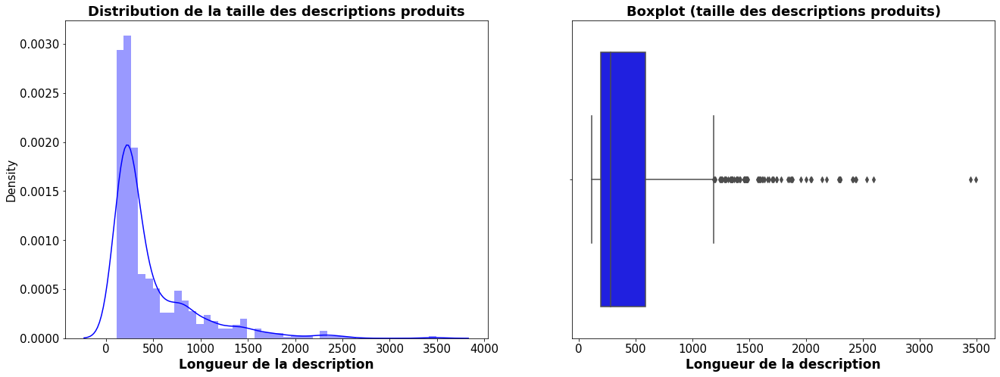

In [24]:
plt.figure(figsize = (22, 17))

plt.subplot(2, 2, 1)
plt.xticks(size = 15)
plt.xlabel('Longueur de la description', weight='bold', size=17)
plt.title('Distribution de la taille des descriptions produits',size = 18, weight = 'bold')
sns.distplot(description_length, color='blue')

plt.subplot(2, 2, 2)
plt.xticks(size = 15)
plt.xlabel('Longueur de la description', weight='bold', size=17)
plt.title('Boxplot (taille des descriptions produits)',size = 18, weight = 'bold')
sns.boxplot(description_length, color='blue')
plt.savefig('distribution longueur description',dpi=200, bbox_inches='tight')
plt.show()

### Variable 'product_name'

In [383]:
# La longueur des noms de produits

name_length = []

for i in df_cat['product_name']:    
    name_length.append(len(i))

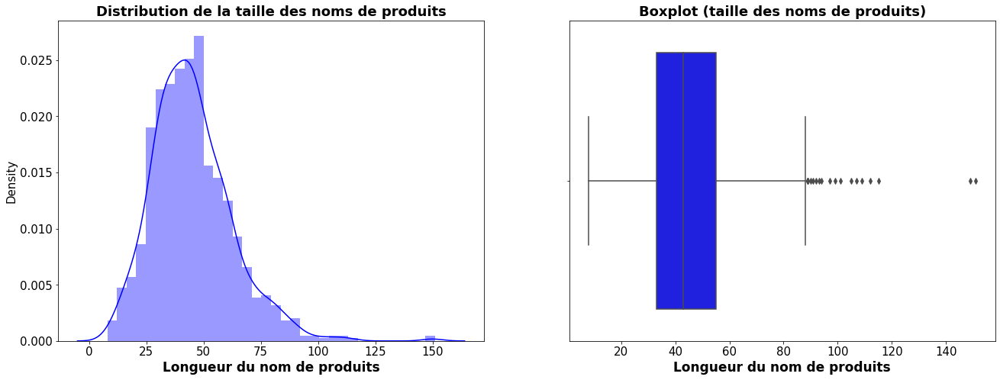

In [384]:
plt.figure(figsize = (22, 17))

plt.subplot(2, 2, 1)
plt.xticks(size = 15)
plt.xlabel('Longueur du nom de produits', weight='bold', size=17)
plt.title('Distribution de la taille des noms de produits',size = 18, weight = 'bold')
sns.distplot(name_length, color='blue')

plt.subplot(2, 2, 2)
plt.xticks(size = 15)
plt.xlabel('Longueur du nom de produits', weight='bold', size=17)
plt.title('Boxplot (taille des noms de produits)',size = 18, weight = 'bold')
sns.boxplot(name_length, color='blue')
plt.savefig('distribution longueur product_name',dpi=200, bbox_inches='tight')
plt.show()

In [385]:
mean(name_length)

45.10190476190476

## <font color="blue" id="section_3_1"> 3-1 Pré-traitement du texte

In [86]:
df_cat.head(2)

,product_name,image,description,categories
0,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Home Furnishing
1,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care


### Pré-traitement des descriptions

Techniques réalisées pour le pré-traitement du texte  :
- Remove Punctuations
- Lower Case
- Remove digits and words containing digits
- Remove Stopwords
- Lemmatization | Stemming

#### Exemple de traitement d'une description par étape

In [64]:
df_description = df_cat['description']
df_ex = df_description.copy()

In [77]:
df_ex = df_description.copy()
# Text original
description_example = df_ex.iloc[5]
print('======== Text original ========')
print(description_example,'\n')

# Remove punctuations
df_ex = df_ex.apply(lambda x: re.sub('[%s]' % re.escape(punctuation), '' , x))
print('======== Remove punctuations ========')
print(df_ex[5],'\n')

# Lower_case
df_ex = df_ex.apply(lambda x: x.lower())
print('======== Lower_case ========')
print(df_ex[5],'\n')

# Remove digits and words with  digits
df_ex = df_ex.apply(lambda x: re.sub(r'\w*\d\w*','',x))
print('======== Remove digits ========')
print(df_ex[5],'\n')

# Remove stopwords    
df_ex = df_ex.apply(lambda x: remove_stopwords(x))
print('======== Remove stopwords ========')
print(df_ex[5],'\n')

# lemmatization    
df_ex_lemm = df_ex.apply(lambda text: lemmatize_words(text))
print('======== Lemmatization ========')
print(df_ex_lemm[5],'\n')

# Stemming
df_ex_stemm = df_ex.apply(lambda text: Stem_words(text))
print('========== Stemming ==========')
print(df_ex_stemm[5],'\n')

======== Text original ========
Maserati Time R8851116001 Analog Watch  - For Boys - Buy Maserati Time R8851116001 Analog Watch  - For Boys  R8851116001 Online at Rs.24400 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery! 

======== Remove punctuations ========
Maserati Time R8851116001 Analog Watch   For Boys  Buy Maserati Time R8851116001 Analog Watch   For Boys  R8851116001 Online at Rs24400 in India Only at Flipkartcom  Great Discounts Only Genuine Products 30 Day Replacement Guarantee Free Shipping Cash On Delivery 

======== Lower_case ========
maserati time r8851116001 analog watch   for boys  buy maserati time r8851116001 analog watch   for boys  r8851116001 online at rs24400 in india only at flipkartcom  great discounts only genuine products 30 day replacement guarantee free shipping cash on delivery 

======== Remove digits ========
maserati time  analog watch   for boys  buy maserati time  

### Dans la suite, le pré-traitment du texte est effectué avec la fonction (prep_text) qui permet de choisir de faire la lemmatisation et/ou le stemming

## <font color="blue" id="section_3_2"> 3-2 Bag of words (BOW)

### <font color="blue" id="section_3_2_1"> 3-2-1 Count vectorizer

#### Via la variable product_name

In [89]:
df_name = df_cat['product_name']
df_name[10]

'Calibro SW-125 Analog-Digital Watch  - For Men, Boys'

#### Texte brut sans aucun pré-traitement (ARI 0.399)


In [94]:
df_categories = df_cat['categories']


In [438]:
df_nameb = df_name.copy()

df_nameb_cv, vocab_nameb = vect_vocab(df_nameb, CountVectorizer())
df_nameb_cv_acp = acp(df_nameb_cv)
df_nameb_cv_acp_tsne = tsne(df_nameb_cv_acp, 40)
df_nameb_cv_acp_tsne_km, ARI, labels = kmeans(df_nameb_cv_acp_tsne, df_categories)                            


il y a 2354 vocabulaires
temps traitement :  0.02
nombre de features après reduction ACP pour 99% de variance : 887
-----------------------------------------
 coefficient de silhouette : 0.5120999813079834
 ARI  : 0.3998
-----------------------------------------


#### Texte clean pré-traité avec lemmatisation (ARI = 0.4 )

il y a 1782 vocabulaires
temps traitement :  0.02
nombre de features après reduction ACP pour 99% de variance : 757
-----------------------------------------
 coefficient de silhouette : 0.4708999991416931
 ARI  : 0.4039
-----------------------------------------


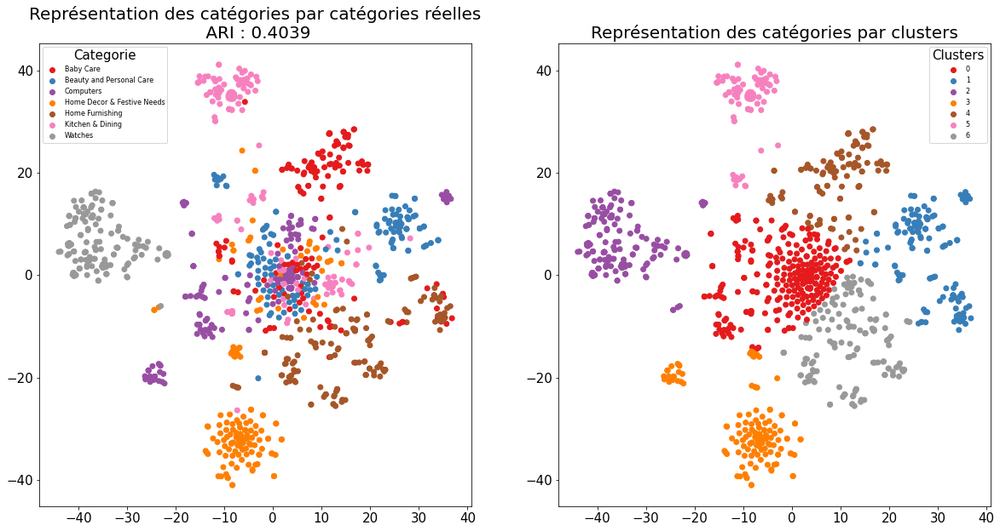

In [439]:
df_namec = prep_text(df_nameb, stemm=False, lemm=True)

df_namec_cv, vocab_namec = vect_vocab(df_namec, CountVectorizer())
df_namec_cv_acp = acp(df_namec_cv)
df_namec_cv_acp_tsne = tsne(df_namec_cv_acp, 40)
df_namec_cv_acp_tsne_km, ARI, labels = kmeans(df_namec_cv_acp_tsne, df_categories)                            
TSNE_visu_fct(df_namec_cv_acp_tsne, labels, ARI)

plt.savefig('tsne prodname clean countvec',dpi=200, bbox_inches='tight')
plt.show()

#### On note deja un regroupement des produits avec les 7 catégories et un indice de similarité de 40% ce qui est très correct. Meme si cette variable donne des bons resultats (comme la suite le confirmera aussi), on va extraire les features de la variable 'Description' car il est demandé explicitement de l'utiliser dans le projet peut etre parceque cela requiert plus de traitement de texte  

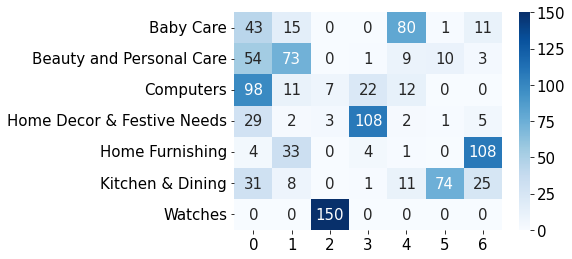

In [440]:

conf_mat(df_namec_cv_acp_tsne_km['label'], df_namec_cv_acp_tsne_km['cluster_id'])
plt.savefig('confusion matrix namec_cv',dpi=200, bbox_inches='tight')
plt.show()

#### Via la variable 'description' (ARI 0.45)

In [441]:
df_description = df_cat['description']

df_descc = prep_text(df_description, stemm=False, lemm=True)

df_descc_cv, vocab_descc = vect_vocab(df_descc, CountVectorizer())
df_descc_cv_acp = acp(df_descc_cv)
df_descc_cv_acp_tsne = tsne(df_descc_cv_acp, 40)
df_descc_cv_acp_tsne_km, ARI, labels = kmeans(df_descc_cv_acp_tsne, df_categories)                            


il y a 4830 vocabulaires
temps traitement :  0.08
nombre de features après reduction ACP pour 99% de variance : 540
-----------------------------------------
 coefficient de silhouette : 0.4577000141143799
 ARI  : 0.4506
-----------------------------------------


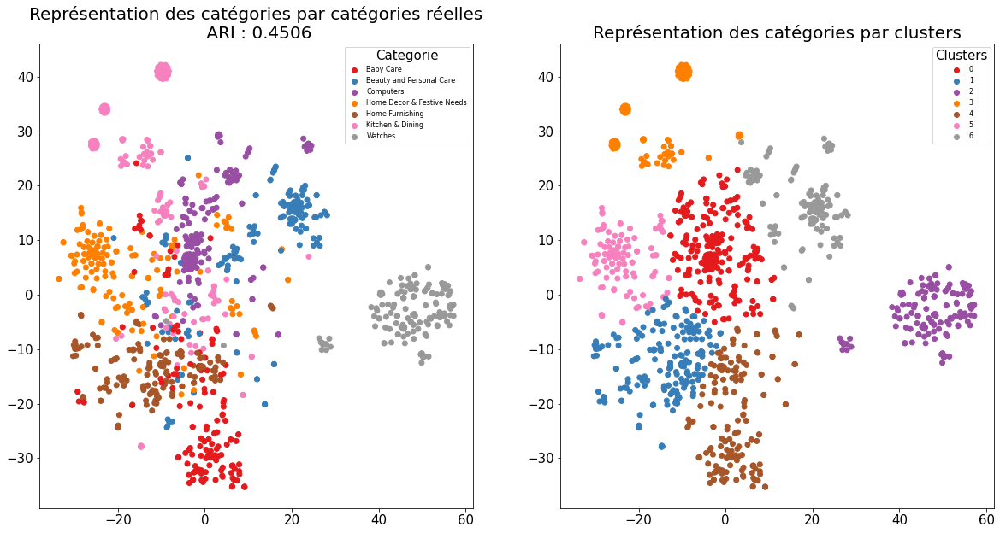

In [423]:
TSNE_visu_fct(df_descc_cv_acp_tsne_km, labels, ARI)

plt.savefig('tsne desc clean countvec',dpi=200, bbox_inches='tight')
plt.show()

#### bi-grams (ARI 0.4)

il y a 22282 vocabulaires
temps traitement :  0.17
nombre de features après reduction ACP pour 99% de variance : 666
-----------------------------------------
 coefficient de silhouette : 0.4426000118255615
 ARI  : 0.4067
-----------------------------------------


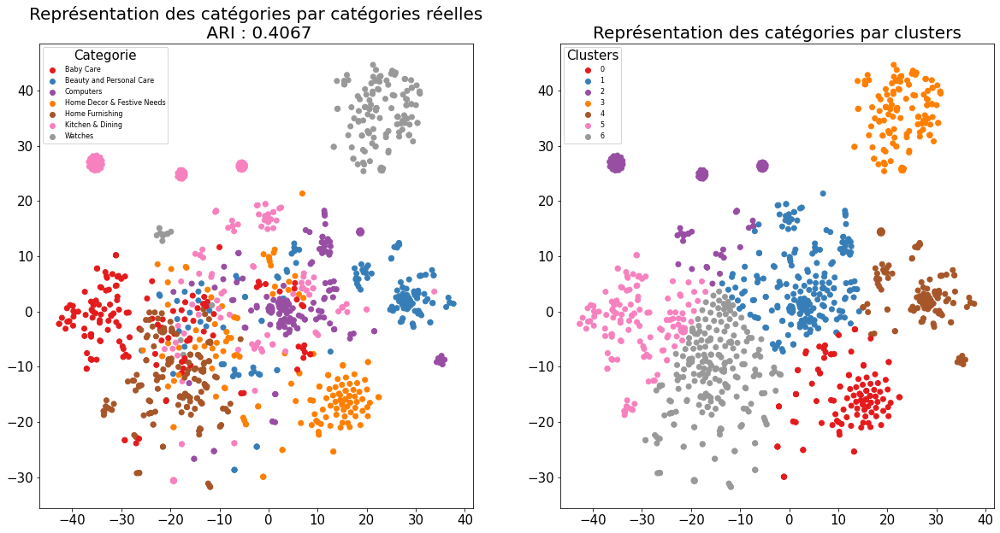

In [442]:
# bi-grams 

df_descc_cvng, vocab_descc_cvng = vect_vocab(df_descc, CountVectorizer(ngram_range=(1, 2)))
df_descc_cvng_acp = acp(df_descc_cvng)
df_descc_cvng_acp_tsne = tsne(df_descc_cvng_acp, 40)
df_descc_cvng_acp_tsne_km, ARI, labels = kmeans(df_descc_cvng_acp_tsne, df_categories)                            
TSNE_visu_fct(df_descc_cvng_acp_tsne, labels, ARI)

plt.savefig('tsne desc clean n gram countvec',dpi=200, bbox_inches='tight')
plt.show()

Comme attendu dans ce context, bi-grams n'améliore pas les résultats

### <font color="blue" id="section_3_2_2"> 3-2-2 Tf-idf

ARI lemm 0.5744, stem 0.5749 , ss les 2 : 0.553 ; lem+stem 0.545  bi grams lemma 0.4798 prodname lemm 0.5589
ARI lemm ss acp 0.539

#### tfidf via product_name (ARI  0.5589)

In [444]:
# product name clean avec lemma

df_namec_tf, vocab_namec_tf = vect_vocab(df_namec, TfidfVectorizer())
df_namec_tf_acp = acp(df_namec_tf)
df_namec_tf_acp_tsne = tsne(df_namec_tf_acp, 20)
df_namec_tf_acp_tsne_km, ARI, labels = kmeans(df_namec_tf_acp_tsne, df_categories)                            


il y a 1782 vocabulaires
temps traitement :  0.02
nombre de features après reduction ACP pour 99% de variance : 788
-----------------------------------------
 coefficient de silhouette : 0.4632999897003174
 ARI  : 0.5589
-----------------------------------------


#### tfidf via name/description  (ARI 0.4046)

In [447]:
# tfidf fit product name transform description


df_name_tf, df_descn_tf, vocab_descn = vect_vocab_2text(df_namec, df_descc, TfidfVectorizer())

df_descn_tf_acp = acp(df_descn_tf)
df_descn_tf_acp_tsne = tsne(df_descn_tf_acp, 20)
df_descn_tf_acp_tsne_km, ARI, labels = kmeans(df_descn_tf_acp_tsne, df_categories)    



il y a 1782 vocabulaires
temps traitement :  0.07
nombre de features après reduction ACP pour 99% de variance : 733
-----------------------------------------
 coefficient de silhouette : 0.4722000062465668
 ARI  : 0.4046
-----------------------------------------


#### tfidf via description 

In [135]:
df_descc = prep_text(df_description, stemm=False, lemm=True)
df_descc_no_lem = prep_text(df_description, stemm=False, lemm=False)
df_descc_stem = prep_text(df_description, stemm=True, lemm=False)
df_descc_stem_lemm = prep_text(df_description, stemm=True, lemm=True)

In [514]:
# clean sans lemmatisation (ARI 0.553)

df_descc_tf, vocab_descc_tf = vect_vocab(df_descc_no_lem, TfidfVectorizer())
df_descc_tf_acp = acp(df_descc_tf)
df_descc_tf_acp_tsne = tsne(df_descc_tf_acp, 20)
df_descc_tf_acp_tsne_km, ARI, labels = kmeans(df_descc_tf_acp_tsne, df_categories)                            


il y a 5239 vocabulaires
temps traitement :  0.08
nombre de features après reduction ACP pour 99% de variance : 785
-----------------------------------------
 coefficient de silhouette : 0.48919999599456787
 ARI  : 0.553
-----------------------------------------


In [449]:
# lemma et stem (ARI 0.5458)

df_descc_tf, vocab_descc_tf = vect_vocab(df_descc_stem_lemm, TfidfVectorizer())
df_descc_tf_acp = acp(df_descc_tf)
df_descc_tf_acp_tsne = tsne(df_descc_tf_acp, 20)
df_descc_tf_acp_tsne_km, ARI, labels = kmeans(df_descc_tf_acp_tsne, df_categories)  

il y a 4263 vocabulaires
temps traitement :  0.07
nombre de features après reduction ACP pour 99% de variance : 778
-----------------------------------------
 coefficient de silhouette : 0.5044000148773193
 ARI  : 0.5458
-----------------------------------------


In [450]:
# bi gramms (ARI 0.4798)

df_descc_tf, vocab_descc_tf = vect_vocab(df_descc, TfidfVectorizer(ngram_range=(1, 2)))
df_descc_tf_acp = acp(df_descc_tf)
df_descc_tf_acp_tsne = tsne(df_descc_tf_acp, 20)
df_descc_tf_acp_tsne_km, ARI, labels = kmeans(df_descc_tf_acp_tsne, df_categories)                            


il y a 22282 vocabulaires
temps traitement :  0.18
nombre de features après reduction ACP pour 99% de variance : 865
-----------------------------------------
 coefficient de silhouette : 0.4715000092983246
 ARI  : 0.4798
-----------------------------------------


In [452]:
# clean avec lemma ss acp (ARI 0.5662)

df_descc_tf_tsne = tsne(df_descc_tf, 20)
df_descc_tf_tsne_km, ARI, labels = kmeans(df_descc_tf_tsne, df_categories)                   

-----------------------------------------
 coefficient de silhouette : 0.5020999908447266
 ARI  : 0.5662
-----------------------------------------


In [453]:
# no lemma avec stem (ARI 0.5749)

df_descc_tf, vocab_descc_tf = vect_vocab(df_descc_stem, TfidfVectorizer())
df_descc_tf_acp = acp(df_descc_tf)
df_descc_tf_acp_tsne = tsne(df_descc_tf_acp, 20)
df_descc_tf_acp_tsne_km, ARI, labels = kmeans(df_descc_tf_acp_tsne, df_categories)  

il y a 4275 vocabulaires
temps traitement :  0.07
nombre de features après reduction ACP pour 99% de variance : 777
-----------------------------------------
 coefficient de silhouette : 0.5001999735832214
 ARI  : 0.5749
-----------------------------------------


il y a 4830 vocabulaires
temps traitement :  0.08
nombre de features après reduction ACP pour 99% de variance : 781
-----------------------------------------
 coefficient de silhouette : 0.5054000020027161
 ARI  : 0.5744
-----------------------------------------


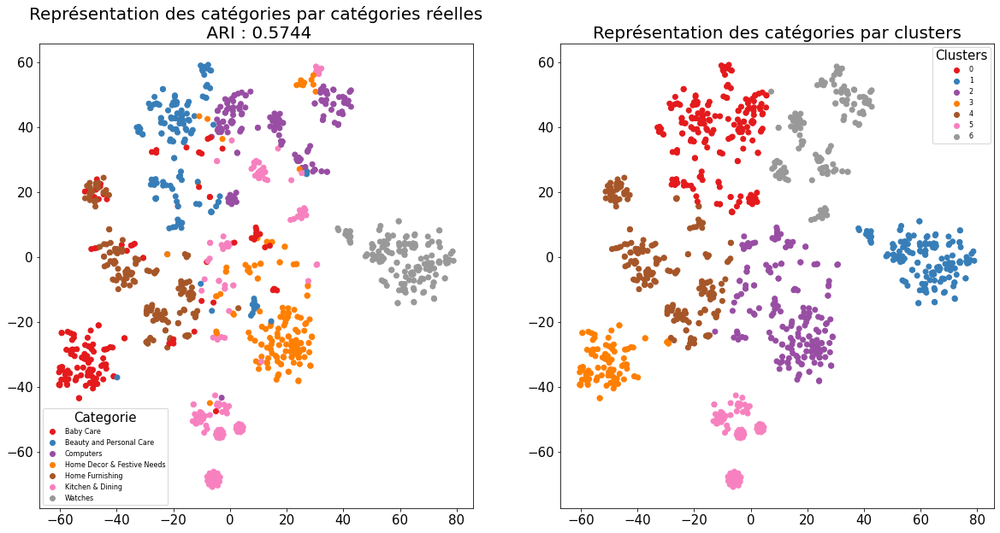

In [454]:
# clean avec lemma (ARI 0.5744)

df_descc_tf, vocab_descc_tf = vect_vocab(df_descc, TfidfVectorizer())
df_descc_tf_acp = acp(df_descc_tf)
df_descc_tf_acp_tsne = tsne(df_descc_tf_acp, 20)
df_descc_tf_acp_tsne_km, ARI, labels = kmeans(df_descc_tf_acp_tsne, df_categories)                            
TSNE_visu_fct(df_descc_tf_acp_tsne, labels, ARI)

plt.savefig('tsne desc clean Tfidf-lemm',dpi=200, bbox_inches='tight')
plt.show()


#### Matrice de confusion après permutation des clusters pour le calcul d'accuracy (somme diagonale max)

,precision,recall,f1-score,support
0,0.948454,0.613333,0.744939,150.000000
1,0.593137,0.806667,0.683616,150.000000
2,0.621429,0.580000,0.600000,150.000000
3,0.707447,0.886667,0.786982,150.000000
4,0.751295,0.966667,0.845481,150.000000
5,0.961538,0.500000,0.657895,150.000000
6,1.000000,1.000000,1.000000,150.000000
accuracy,0.764762,0.764762,0.764762,0.764762
macro avg,0.797614,0.764762,0.759845,1050.000000
weighted avg,0.797614,0.764762,0.759845,1050.000000


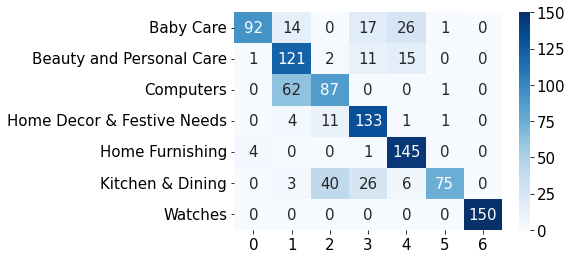

In [180]:
conf_mat_metrics(df_descc_tf_acp_tsne_km)
plt.savefig('confusion matrix tfidf',dpi=200, bbox_inches='tight')
plt.show()

#### tfidf : nettoyage supplémentaire avec seuil de fréquence des mots (les mots les plus et les moins fréquents) 

In [455]:
# max_df=0.52, min_df=0.005(6 documents): sélectionnés à partir de plusieurs tests réalisés

df_descc_tf_freq, vocab_descc_tf_freq = vect_vocab(df_descc, TfidfVectorizer(max_df=0.52, min_df=0.005)) 
df_descc_tf_freq_acp = acp(df_descc_tf_freq)
df_descc_tf_freq_acp_tsne = tsne(df_descc_tf_freq_acp, 20)
df_descc_tf_freq_acp_tsne_km, ARI, labels = kmeans(df_descc_tf_freq_acp_tsne, df_categories)                            


il y a 792 vocabulaires
temps traitement :  0.06
nombre de features après reduction ACP pour 99% de variance : 423
-----------------------------------------
 coefficient de silhouette : 0.508899986743927
 ARI  : 0.6246
-----------------------------------------


il y a 792 vocabulaires
temps traitement :  0.06
-----------------------------------------
 coefficient de silhouette : 0.5174999833106995
 ARI  : 0.6422
-----------------------------------------


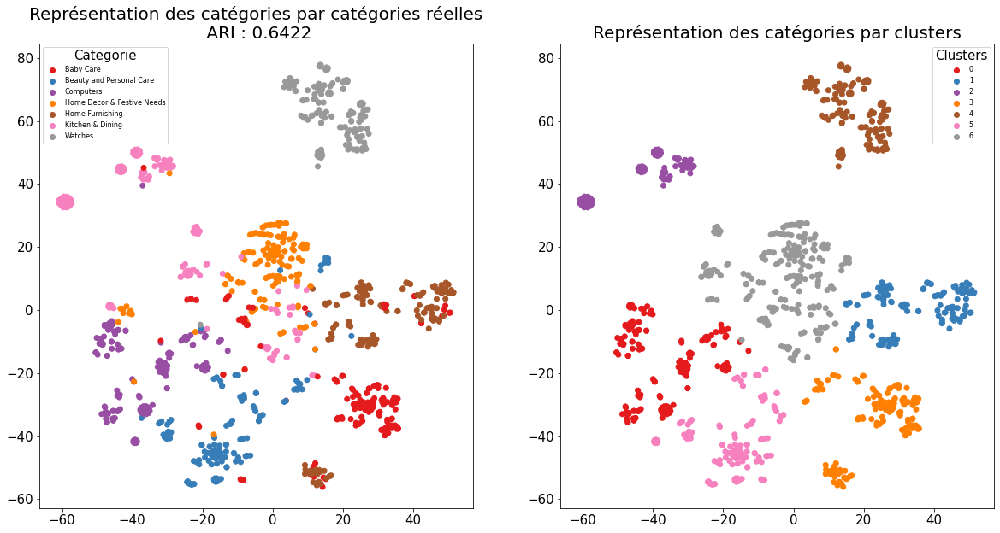

In [517]:
# sans reduction ACP (ARI 0.6422)

df_descc_tf_freq, vocab_descc_tf_freq = vect_vocab(df_descc, TfidfVectorizer(max_df=0.52, min_df=0.005)) # 0.005 ou 6 documents
df_descc_tf_freq_tsne = tsne(df_descc_tf_freq, 20)
df_descc_tf_freq_tsne_km, ARI, labels = kmeans(df_descc_tf_freq_tsne, df_categories)                            
TSNE_visu_fct(df_descc_tf_freq_tsne_km, labels, ARI)

plt.savefig('tsne desc clean Tfidf-freq',dpi=200, bbox_inches='tight')
plt.show()

,precision,recall,f1-score,support
0,0.746479,0.706667,0.726027,150.000000
1,0.865248,0.813333,0.838488,150.000000
2,0.849398,0.940000,0.892405,150.000000
3,0.572650,0.893333,0.697917,150.000000
4,0.914894,0.860000,0.886598,150.000000
5,0.961039,0.493333,0.651982,150.000000
6,1.000000,0.993333,0.996656,150.000000
accuracy,0.814286,0.814286,0.814286,0.814286
macro avg,0.844244,0.814286,0.812868,1050.000000
weighted avg,0.844244,0.814286,0.812868,1050.000000


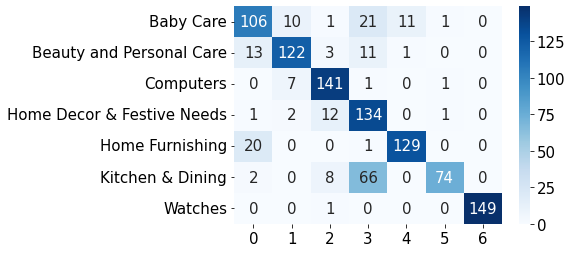

In [227]:
# matrice de confusion clusters permutés
conf_mat_metrics(df_descc_tf_freq_acp_tsne_km)
plt.savefig('confusion matrix tfidf reduction frequence mot',dpi=200, bbox_inches='tight')
plt.show()

Les meilleurs résultats de BOW sont obtenus avec tfidf via la variable 'description' pour un nettoyage supplémentaire de fréquence de mots max(0.52) et min(0.0005) et sans réduction ACP : ARI 0.642 et accuracy 0.81

## <font color="blue" id="section_3_3"> 3-3 Embedding words

### <font color="blue" id="section_3_3_1"> 3-3-1 Word2vec 

In [266]:
df_desc_w2v = df_description.copy()

In [ ]:
df_descc = prep_text(df_description, stemm=False, lemm=True)
df_descc_no_lem = prep_text(df_description, stemm=False, lemm=False)
df_descc_stem = prep_text(df_description, stemm=True, lemm=False)
df_descc_stem_lemm = prep_text(df_description, stemm=True, lemm=True)

In [465]:
# Les paramètres ont été sélectionnés à partir de plusieurs tests effectués

# vect size Dimensionality of the word vectors
w2v_size=300 
# Maximum distance between the current and predicted word within a sentence
w2v_window=10 
#Ignores all words with total frequency lower than this
w2v_min_count=1
# Number of iterations (epochs) over the corpus 100
w2v_epochs=200  
# adapt to length of sentences (medium length 473)
maxlen = 300


time1 = time.time()
    
sentences = df_descc.to_list()

# Convert a document into a list of tokens

sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=0,
                                                workers=1)

w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv   

w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post')
                                                      
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)


# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

embeddings = embed_model.predict(x_sentences)
embeddings.shape

embeddings_df = pd.DataFrame(embeddings) 

time2 = np.round(time.time() - time1,0)
print("temps traitement : ", time2)


Build & train Word2Vec model ...
Vocabulary size: 4648
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4649
Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4649, 300)
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 300)]             0         
                                                                 
 embedding_6 (Embedding)     (None, 300, 300)          1394700   
                                                                 
 global_average_pooling1d_6   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,394,700
Trainable params: 1,394,700
Non-trainable params: 0
_________________________________________________________________
33/33 [==============================] - 0s

In [247]:
embeddings_df

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,0.012293,-0.095873,0.026161,-0.011804,-0.027842,-0.046827,0.035310,-0.005697,0.039171,0.119910,...,-0.024314,0.033506,-0.016287,-0.010710,-0.086417,0.044269,0.024531,0.103525,0.105987,0.110627
1,-0.016316,-0.053162,0.006427,0.031265,-0.039971,-0.001187,0.023762,-0.011062,0.011062,0.014241,...,0.044160,0.052485,-0.009985,-0.021123,-0.013585,0.023262,0.019520,0.019786,-0.005635,0.025346
2,-0.036156,-0.103295,0.013810,-0.003629,-0.113219,-0.002611,0.012148,-0.013182,0.070085,0.059479,...,0.102782,0.090245,-0.026538,-0.041534,0.020076,0.116981,0.036562,0.002014,0.005290,-0.010853
3,-0.043906,-0.061381,0.019498,-0.035275,0.008079,0.004208,-0.007911,-0.067501,0.112293,0.080994,...,0.016178,0.082410,0.018848,-0.016296,-0.021318,0.090346,0.002582,0.023266,-0.004235,0.105946
4,-0.023808,-0.087871,0.057744,-0.028172,-0.069759,0.006535,-0.006967,-0.065423,0.143899,0.106409,...,0.034799,0.082397,0.013137,-0.059470,-0.034499,0.141146,0.008448,0.041134,0.006958,0.137910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,-0.087381,-0.158469,-0.018630,-0.061573,-0.245393,-0.027134,-0.023745,0.063787,0.023338,-0.024550,...,-0.027142,0.031640,0.137734,-0.045419,0.052290,0.109434,0.303118,0.175288,-0.021646,-0.049946
1046,-0.115982,-0.003477,-0.080783,-0.059076,-0.166214,-0.073817,0.020464,0.022769,0.088381,-0.026481,...,0.050916,-0.036897,0.030416,-0.061938,0.031786,0.056014,0.139399,0.107895,0.016723,-0.030510
1047,0.002585,-0.019030,0.002422,-0.006295,-0.039627,-0.011477,0.007093,0.006048,0.009684,-0.005884,...,-0.017862,0.018492,0.039087,-0.005275,0.030826,0.010395,0.046562,0.020730,0.004972,0.010193
1048,-0.000381,-0.013311,-0.002136,0.006249,-0.032402,-0.007871,0.001902,-0.002408,0.012975,-0.008539,...,-0.005635,0.013038,0.024302,-0.000816,0.019542,-0.004676,0.030677,0.027172,0.005951,0.004632


In [463]:
df_w2vec_acp = acp(embeddings_df)
df_w2vec_tsne_acp = tsne(df_w2vec_acp, 20)
df_w2vec_tsne_km_acp, ARI, labels = kmeans(df_w2vec_tsne_acp, df_categories) 

nombre de features après reduction ACP pour 99% de variance : 66
-----------------------------------------
 coefficient de silhouette : 0.5350000262260437
 ARI  : 0.4338
-----------------------------------------


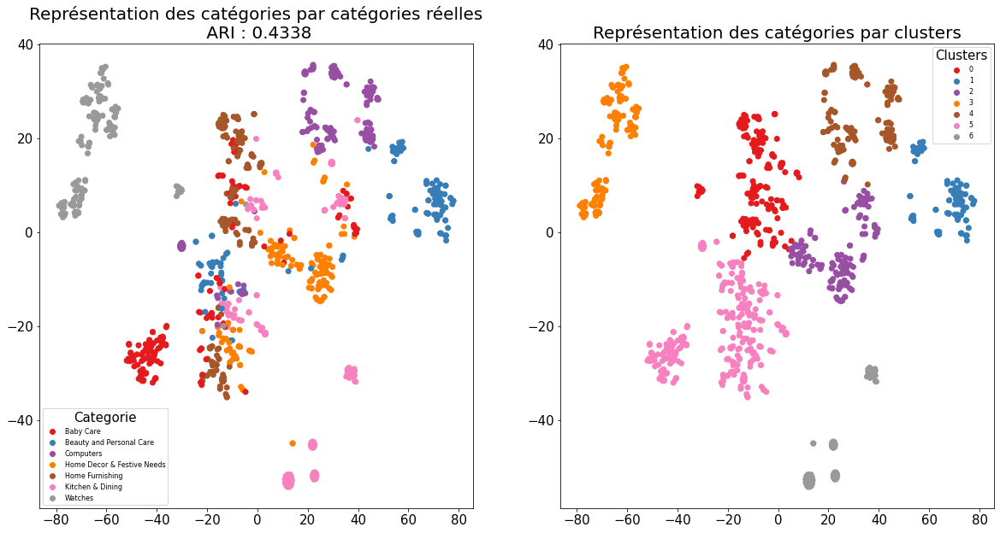

In [464]:
TSNE_visu_fct(df_w2vec_tsne_km_acp, labels, ARI)

plt.savefig('tsne desc clean w2vec',dpi=200, bbox_inches='tight')
plt.show()

### W2vect skip gram (ARI 0.387)

In [ ]:
# Create Skip Gram model
model2 = gensim.models.Word2Vec(data, min_count = 1, vector_size = 100,
                                             window = 5, sg = 1)

In [515]:
df_w2vec_acp = acp(embeddings_df)
df_w2vec_tsne_acp = tsne(df_w2vec_acp, 20)
df_w2vec_tsne_km_acp, ARI, labels = kmeans(df_w2vec_tsne_acp, df_categories) 


nombre de features après reduction ACP pour 99% de variance : 109
-----------------------------------------
 coefficient de silhouette : 0.5245000123977661
 ARI  : 0.387
-----------------------------------------


### <font color="blue" id="section_3_3_2"> 3-3-2 Bidirectional Encoder Representations from Transformers BERT

In [471]:
# Bert

import transformers
from transformers import *

os.environ["TF_KERAS"]='1'


In [472]:
# Fonction de préparation des sentences 
### (Ressources OC du projet : Exemple_Tweets_Feature-extraction_Sentence+Embedding)

def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()
    

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

In [467]:
df_bert = df_description.copy()

In [276]:
df_bert_clean  = prep_text(df_bert, stemm=False, lemm=True)

In [277]:
sentences_bert_nc = df_bert.to_list()
sentences_bert = df_bert_clean.to_list()

### BERT hub Tensorflow

In [487]:
import tensorflow_hub as hub
import tensorflow_text 

# https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'  
bert_layer = hub.KerasLayer(model_url, trainable=True)


In [296]:
sentences_bert_tf = df_description.to_list()
sentences_bert_tfc = df_bert_clean.to_list() 

In [308]:
# Les paramètres ont été selectionnés après avoir tester plusieurs combinaisons de valeurs (df_HF)
max_length = 25
batch_size = 30
model_type = 'bert-base-uncased'
model = bert_layer

features_bert_tfc, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences_bert_tfc, 
                                                         max_length, batch_size, mode='TFhub')

loading configuration file https://huggingface.co/bert-base-uncased/resolve/main/config.json from cache at C:\Users\MyPc/.cache\huggingface\transformers\3c61d016573b14f7f008c02c4e51a366c67ab274726fe2910691e2a761acf43e.37395cee442ab11005bcd270f3c34464dc1704b715b5d7d52b1a461abe3b9e4e
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.21.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file https://huggingface.co/bert-base-uncased/re

temps traitement :  45.0


In [298]:
features_bert_tfc

array([[ 0.23219131, -0.19616827,  0.53956825, ..., -0.09663658,
        -0.17886831, -0.05979583],
       [ 0.4592122 , -0.15523162,  0.31258592, ..., -0.10680233,
        -0.3344912 ,  0.27066   ],
       [ 0.40438637, -0.10664259,  0.632342  , ..., -0.26511627,
        -0.39775252,  0.09045341],
       ...,
       [ 0.35129884, -0.1391106 ,  0.5177587 , ..., -0.10820417,
        -0.03044545, -0.10238994],
       [ 0.21519339,  0.01189631,  0.37602043, ...,  0.228778  ,
        -0.03422118, -0.5070466 ],
       [ 0.26268765, -0.26254722,  0.63974357, ...,  0.20054974,
         0.01403605, -0.2392836 ]], dtype=float32)

In [334]:
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_bert_tf = tsne_red.fit_transform(features_bert_tfc)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_bert_tf.shape[1]+1, 1)]
df_bert_tf_tsne = pd.DataFrame(X_tsne_bert_tf, index=df_cat.index, columns=columns)

In [492]:
# résultats des différentes valeurs pour max_length et batch_size
resultat_TF = {'max_length': [64,25,25,25,25,30] ,'batch_size': [10, 10, 21, 25, 30, 30], 'ARI':[0.317,0.419,0.428, 0.44, 0.529, 0.48]}
df_TF = pd.DataFrame(resultat_TF)
df_TF

,max_length,batch_size,ARI
0,64,10,0.317
1,25,10,0.419
2,25,21,0.428
3,25,25,0.440
4,25,30,0.529
5,30,30,0.480


### meilleur résultat obtenu :  max_length=25, batch_size=30	ARI=0.5229

-----------------------------------------
 coefficient de silhouette : 0.4731000065803528
 ARI  : 0.5229
-----------------------------------------


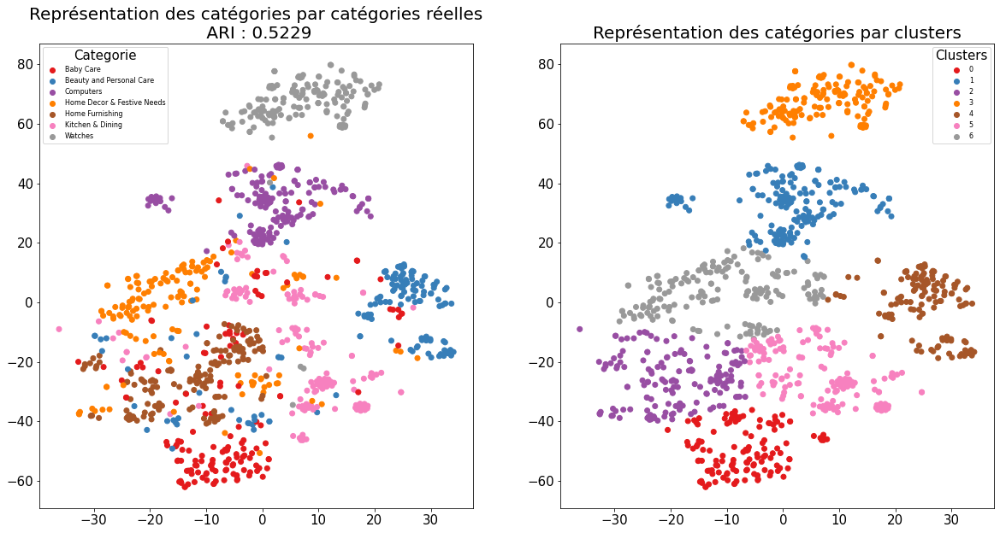

In [486]:
df_bert_tf_tsne_km, ARI, labels = kmeans(df_bert_tf_tsne, df_categories)

TSNE_visu_fct(df_bert_tf_tsne_km, labels, ARI)
plt.savefig('bert_tf_tsne_km',dpi=200, bbox_inches='tight')
plt.show()

### HuggingFace
### 'bert-base-uncased'

In [473]:
max_length = 25
batch_size = 30 
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)

loading configuration file https://huggingface.co/bert-base-uncased/resolve/main/config.json from cache at C:\Users\MyPc/.cache\huggingface\transformers\3c61d016573b14f7f008c02c4e51a366c67ab274726fe2910691e2a761acf43e.37395cee442ab11005bcd270f3c34464dc1704b715b5d7d52b1a461abe3b9e4e
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.21.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file https://huggingface.co/bert-base-un

In [474]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences_bert, 
                                                         max_length, batch_size, mode='HF')

loading configuration file https://huggingface.co/bert-base-uncased/resolve/main/config.json from cache at C:\Users\MyPc/.cache\huggingface\transformers\3c61d016573b14f7f008c02c4e51a366c67ab274726fe2910691e2a761acf43e.37395cee442ab11005bcd270f3c34464dc1704b715b5d7d52b1a461abe3b9e4e
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.21.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file https://huggingface.co/bert-base-uncased/re

1/1 [==============================] - 2s 2s/step
temps traitement :  75.0


In [475]:
X_tsne_bert = tsne_red.fit_transform(features_bert)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_bert.shape[1]+1, 1)]
df_bert_hf_tsne = pd.DataFrame(X_tsne_bert, index=df_cat.index, columns=columns)

-----------------------------------------
 coefficient de silhouette : 0.48820000886917114
 ARI  : 0.5344
-----------------------------------------


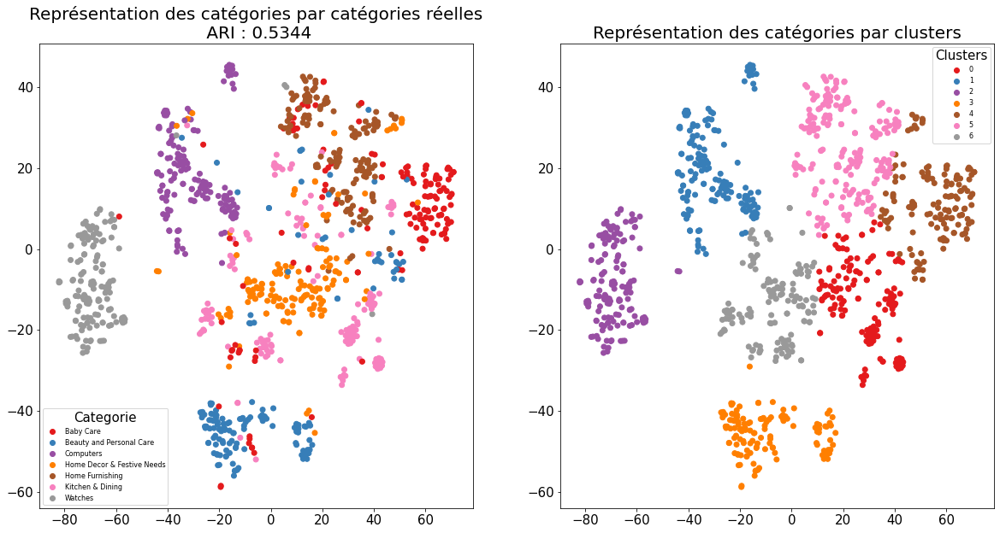

In [477]:
df_bert_hf_tsne_km, ARI, labels = kmeans(df_bert_hf_tsne, df_categories)
TSNE_visu_fct(df_bert_hf_tsne_km, labels, ARI)

plt.savefig('bert_hf_tsne_km',dpi=200, bbox_inches='tight')
plt.show()

,precision,recall,f1-score,support
0,0.647887,0.613333,0.630137,150.000000
1,0.857143,0.720000,0.782609,150.000000
2,0.943038,0.993333,0.967532,150.000000
3,0.471014,0.433333,0.451389,150.000000
4,0.641026,0.833333,0.724638,150.000000
5,0.464789,0.440000,0.452055,150.000000
6,0.979866,0.973333,0.976589,150.000000
accuracy,0.715238,0.715238,0.715238,0.715238
macro avg,0.714966,0.715238,0.712135,1050.000000
weighted avg,0.714966,0.715238,0.712135,1050.000000


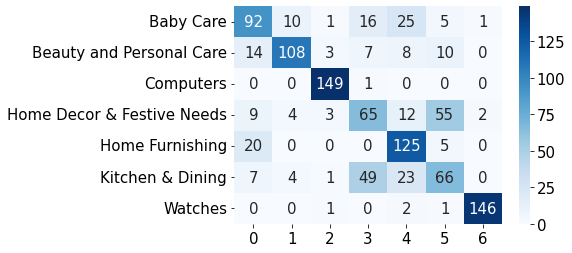

In [509]:
conf_mat_metrics(df_bert_hf_tsne_km)
plt.savefig('bert HF name confusion matrix',dpi=200, bbox_inches='tight')
plt.show()

### <font color="blue" id="section_3_3_3"> 3-3-3 Universal Sentence Encoder (USE)

In [79]:
# load use version 5
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/5")

In [345]:
# fonction d'extraction de feature via USE
# Ressources OC du projet : Exemple_Tweets_Feature-extraction_Sentence+Embedding 


def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    print(time2)
    return features

In [340]:
df_use = df_description.copy()

df_use_c_lem  = prep_text(df_use, stemm=False, lemm=True)
df_use_c  = prep_text(df_use, stemm=False, lemm=False)
df_use_c_stem  = prep_text(df_use, stemm=True, lemm=False)


sentences_use = df_description.to_list()
sentences_use_c = df_use_c.to_list() 
sentences_use_c_lem = df_use_c_lem.to_list()
sentences_use_c_stem = df_use_c_stem.to_list() 

### Via product_name

In [350]:
#df_nameb et df_namec
sentences_usen = df_nameb.to_list()
sentences_usen_c = df_namec.to_list() 

# text ss aucun traitement 
b_size = 30
features_USE = feature_USE_fct(sentences_usen, b_size)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=20)
X_tsne_USE = tsne_red.fit_transform(features_USE)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_USE.shape[1]+1, 1)]
df_USE_tsne = pd.DataFrame(X_tsne_USE, index=df_cat.index, columns=columns)

df_USE_tsne_km, ARI, labels = kmeans(df_USE_tsne, df_categories)

4.0
-----------------------------------------
 coefficient de silhouette : 0.5277000069618225
 ARI  : 0.6794
-----------------------------------------


In [496]:
# product_name clean avec lemma, batch_size=30 
features_USE_30 = feature_USE_fct(sentences_usen_c, 30)


X_tsne_USE_30 = tsne_red.fit_transform(features_USE_30)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_USE_30.shape[1]+1, 1)]
df_USE_tsne_30 = pd.DataFrame(X_tsne_USE_30, index=df_cat.index, columns=columns)

df_USE_tsne_km_30, ARI, labels = kmeans(df_USE_tsne_30, df_categories)

4.0
-----------------------------------------
 coefficient de silhouette : 0.5375999808311462
 ARI  : 0.7208
-----------------------------------------


In [497]:
# product_name clean avec lemma, batch_size=25 
features_USE_25 = feature_USE_fct(sentences_usen_c, 25)

X_tsne_USE_25 = tsne_red.fit_transform(features_USE_25)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_USE_25.shape[1]+1, 1)]
df_USE_tsne_25 = pd.DataFrame(X_tsne_USE_25, index=df_cat.index, columns=columns)

df_USE_tsne_km_25, ARI, labels = kmeans(df_USE_tsne_25, df_categories)


5.0
-----------------------------------------
 coefficient de silhouette : 0.5579000115394592
 ARI  : 0.7402
-----------------------------------------


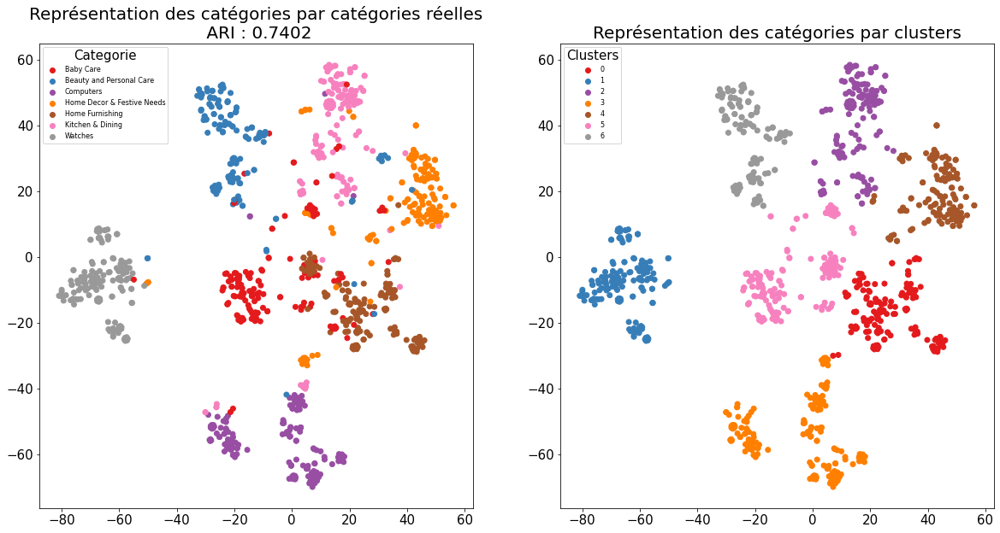

In [499]:
TSNE_visu_fct(df_USE_tsne_km_25, labels, ARI)

plt.savefig('best74_USE_tsne_km_name_clean_lem',dpi=200, bbox_inches='tight')
plt.show()

,precision,recall,f1-score,support
0,0.773333,0.773333,0.773333,150.000000
1,0.969925,0.860000,0.911661,150.000000
2,0.853801,0.973333,0.909657,150.000000
3,0.846715,0.773333,0.808362,150.000000
4,0.843137,0.860000,0.851485,150.000000
5,0.886667,0.886667,0.886667,150.000000
6,0.961538,1.000000,0.980392,150.000000
accuracy,0.875238,0.875238,0.875238,0.875238
macro avg,0.876445,0.875238,0.874508,1050.000000
weighted avg,0.876445,0.875238,0.874508,1050.000000


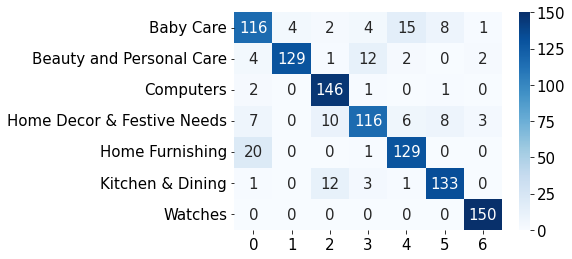

In [500]:
conf_mat_metrics(df_USE_tsne_km_25)
plt.savefig('use74 name confusion matrix',dpi=200, bbox_inches='tight')
plt.show()

### Via description

In [348]:
# text ss aucun traitement 
b_size = 30
features_USE = feature_USE_fct(sentences_use, b_size)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=20)
X_tsne_USE = tsne_red.fit_transform(features_USE)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_USE.shape[1]+1, 1)]
df_USE_tsne = pd.DataFrame(X_tsne_USE, index=df_cat.index, columns=columns)

df_USE_tsne_km, ARI, labels = kmeans(df_USE_tsne, df_categories)

59.0
-----------------------------------------
 coefficient de silhouette : 0.5238000154495239
 ARI  : 0.4844
-----------------------------------------


In [353]:
# desc clean sslemma 0.4784
b_size = 30
features_USE = feature_USE_fct(sentences_use_c, b_size)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=20)
X_tsne_USE = tsne_red.fit_transform(features_USE)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_USE.shape[1]+1, 1)]
df_USE_tsne = pd.DataFrame(X_tsne_USE, index=df_cat.index, columns=columns)

df_USE_tsne_km, ARI, labels = kmeans(df_USE_tsne, df_categories)

34.0
-----------------------------------------
 coefficient de silhouette : 0.5307000279426575
 ARI  : 0.4784
-----------------------------------------


In [352]:
# desc clean+lemma
b_size = 30
features_USE = feature_USE_fct(sentences_use_c_lem, b_size)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=20)
X_tsne_USE = tsne_red.fit_transform(features_USE)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_USE.shape[1]+1, 1)]
df_USE_tsne = pd.DataFrame(X_tsne_USE, index=df_cat.index, columns=columns)

df_USE_tsne_km, ARI, labels = kmeans(df_USE_tsne, df_categories)

33.0
-----------------------------------------
 coefficient de silhouette : 0.5389999747276306
 ARI  : 0.6168
-----------------------------------------


In [505]:
# desc clean+lemma b_size=25

features_USE = feature_USE_fct(sentences_use_c_lem, 25)

X_tsne_USE = tsne_red.fit_transform(features_USE)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_USE.shape[1]+1, 1)]
df_USE_tsne = pd.DataFrame(X_tsne_USE, index=df_cat.index, columns=columns)

df_USE_tsne_km, ARI, labels = kmeans(df_USE_tsne, df_categories)

41.0
-----------------------------------------
 coefficient de silhouette : 0.5371999740600586
 ARI  : 0.6112
-----------------------------------------


### Bilan global pour la classification via la partie texte 

En se basant sur les données ‘descriptions’,  le meilleur résultat obtenu avec tf-idf nettoyage supplémentaire (df_max 0,52, df-min 0,005) :  tf-idf ARI 0.64, accuracy 0.81

En se basant sur ‘product-name’, le meilleur résultat obtenu avec USE5 : ARI 0.74, accuracy 0.875


# <font color="blue" id="section_4"> 4-Partie visuelle (images) 

In [488]:
# Fonction qui affiche l'image et son histogramme ainsi que son histogramme cumulitif

def afficher_image_histopixel(image, titre):
    
    plt.figure(figsize=(40, 10))
    plt.subplot(131)
    plt.title(titre, fontsize=30)
    plt.imshow(image, cmap='gray')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(132)
    plt.title('Histogramme de répartition des pixels', fontsize=30)
    hist, bins = np.histogram(np.array(image).flatten(), bins=256)
    plt.bar(range(len(hist[0:255])), hist[0:255])
    plt.xlabel('Niveau de gris', fontsize=30)
    plt.ylabel('Nombre de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(133)
    plt.title('Histogramme cumulé des pixels', fontsize=30)
    plt.hist(np.array(image).flatten(), bins=range(256), cumulative=True)
    plt.xlabel('Niveau de gris', fontsize=24)
    plt.ylabel('Fréquence cumulée de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

In [680]:
# fonction de pre-traitement d'image 

def preprocess_image(image):
 
    
    # Variable pour redimensionner images
    dim = (224, 224)
    
    # Nom de l'image
    file_dir = os.path.split(image)
    
    # Chargement de l'image originale
    img = Image.open(image)

    # Correction de l'exposition PILS (étirement de l'histogramme)
    img = ImageOps.autocontrast(img, 1)

    # Conversion en niveau de gris de l'image
    img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)

    # Correction du contraste OpenCV CLAHE (égalisation de l'histogramme)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
    img = clahe.apply(img)

    # Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
    img = cv2.fastNlMeansDenoising(img, None, 5, 7, 21)

    # Redimensionnement en 224 * 224
    img = cv2.resize(np.array(img), dim, interpolation=cv2.INTER_AREA)

    # Sauvegarde de l'image dans le répertoire data/Images_process
    cv2.imwrite(file_dir[0]+ '/Images_process/' + file_dir[1], img)

    return file_dir[0] + '/Images_process/' + file_dir[1]


In [681]:
# fonction pour cherger les images
def charger_image_repertoire(repertoire):
    # Chargement des images pré-traitées
    images = {}
    for filename in os.listdir(repertoire):
        path = repertoire + "/" + filename
        img = cv2.imread(path, 0) 
        images[filename] = img 
    return images


In [682]:
# Creates descriptors using sift
# Takes one parameter that is images dictionary
# Return an array whose first index holds the decriptor_list without an order
# And the second index holds the sift_vectors dictionary which holds the
# descriptors but this is seperated class by class

def sift_extraire_features(images):
    '''
    Extraire les descripteurs et keypoints avec SIFT.
    Parameters
    ----------
    images : les images dont on veut extraire les descripteurs et centres
             d'intérêt, obligatoire.
    Returns
    -------
    list des descripteurs et des vecteurs SIFT.
    '''
    sift_vectors = {}
    descriptor_list = []
    sift = cv2.SIFT_create()
    for key, value in images.items():
        features = []
        kp, des = sift.detectAndCompute(value, None)
        descriptor_list.extend(des)
        # in case no descriptor
        des = [np.zeros((128,))] if des is None else des
        features.append(des)
        sift_vectors[key] = features
    return [descriptor_list, sift_vectors]


In [683]:
# Cette fonction permet de calculer le nombre de clusters le plus optimal selon la dispersion
    
def calcul_metrics_kmeans(liste_visual_words, dataframe_metrique, type_algo,
                          nb_cluster):
   
    
    dispersion = []
   
    donnees = []
    temps = []

    result_k = []

    # Recherche des hyperparamètres
    for var_k in nb_cluster:

        # Top début d'exécution
        time_start = time.time()

        # Initialisation de l'algorithme
        cls = MiniBatchKMeans(n_clusters=var_k,
                     random_state=0)

        # Entraînement de l'algorithme
        cls.fit(liste_visual_words)

        # Top fin d'exécution
        time_end = time.time()

        # Calcul la dispersion
        disp = cls.inertia_
        
        # Durée d'exécution
        time_execution = time_end - time_start
        display('Paramètre ' + str(var_k) + ' terminé')

        dispersion.append(disp)

        donnees.append(type_algo)
        temps.append(time_execution)

        result_k.append(var_k)

    dataframe_metrique = dataframe_metrique.append(pd.DataFrame({
        'Type_données': donnees,
        'Param_k': result_k,
        'dispersion': dispersion,     
        'Durée (s)': temps
    }), ignore_index=True)

    return dataframe_metrique 

In [684]:
# Source https://github.com/AybukeYALCINER/gabor_sift_bovw/blob/12d54f34226ec448f2e6f0fbc7c9a10052527368/assignment1.py#L157
# Find the index of the closest central point to the each sift descriptor.
# Takes 2 parameters the first one is a sift descriptor and the second one is the array of central points in k means
# Returns the index of the closest central point.

def find_index(image, center):
    count = 0
    ind = 0
    for i in range(len(center)):
        if(i == 0):
            count = distance.euclidean(image, center[i])
            #count = L1_dist(image, center[i])
        else:
            dist = distance.euclidean(image, center[i])
            #dist = L1_dist(image, center[i])
            if(dist < count):
                ind = i
                count = dist
    return ind




In [685]:
# Source https://github.com/AybukeYALCINER/gabor_sift_bovw/blob/12d54f34226ec448f2e6f0fbc7c9a10052527368/assignment1.py#L157
# --------------------------------------------------------------------

# funtion takes 2 parameters. The first one is a dictionary that holds the descriptors that are separated class by class
# And the second parameter is an array that holds the central points (visual words) of the k means clustering
# Returns a dictionary that holds the histograms for each images that are
# separated class by class.


def image_class(all_bovw, centers):
    
   
    dict_feature = {}
    for key, value in all_bovw.items():
        # display(key)
        category = []
        for img in value:
            # display(img)
            histogram = np.zeros(len(centers))
            for each_feature in img:
                ind = find_index(each_feature, centers)
                histogram[ind] += 1
            category.append(histogram)
        dict_feature[key] = category
    return dict_feature


In [686]:
# -- Constituer le vecteur des features
# --------------------------------------------------------------------

def constituer_dataframe_vectors(dataframe, variable):
    '''
    Transformer les np.array des histogrammes en autant de colonnes pour
    être utilisable par TSNE et le clustering.
    Parameters
    ----------
    dataframe : dataframe des histogrammes des images.
    variable : nom de la variable contenant les histogrammes à extraire.
    Returns
    -------
    dataframe_vecteurs : le dataframe avec chacune des BOVW de chaque image
    dans une colonne.
    '''
    vectors = np.column_stack(dataframe[variable].values.tolist())
    dataframe_vecteurs = pd.DataFrame(vectors).T

    return dataframe_vecteurs

### Exemple affichage image

In [523]:
# Ajout variable image_loc

folder = r"C:\Users\MyPc\Desktop\reconversionProf\webinaropenclassroom\Projets\P6\Flipkart\Images"
df_cat['image_loc'] = [(folder + '/') + row for row in df_cat['image']]

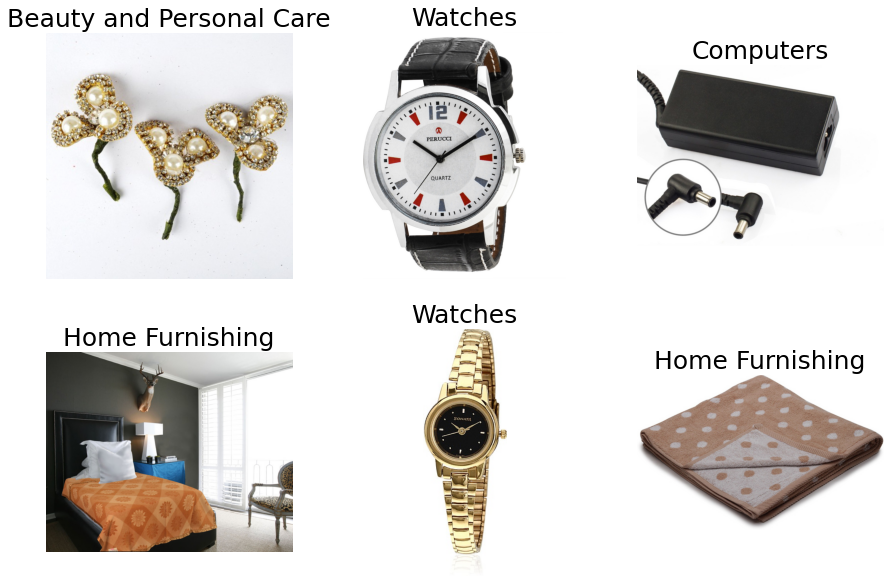

In [30]:
# Affichage de 6 images au hasard
visu_img = df_cat.sample(6).reset_index()
plt.figure(figsize=(15, 10))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    # Charge l'image comme matrice de pixels
    img = np.array(Image.open(visu_img['image_loc'][i]))
    plt.imshow(img)
    plt.title(visu_img['categ'][i], fontsize=25)
    plt.axis('off')   
plt.savefig('Exemples samples images',dpi=200, bbox_inches='tight')
plt.show()

## Distribution de Taille et format des images

In [531]:
# Largeur des images
df_cat['Largeur_img'] = [Image.open(row).size[0] for row in df_cat['image_loc']]
# Hauteur des images
df_cat['Hauteur_img'] = [Image.open(row).size[1] for row in df_cat['image_loc']]

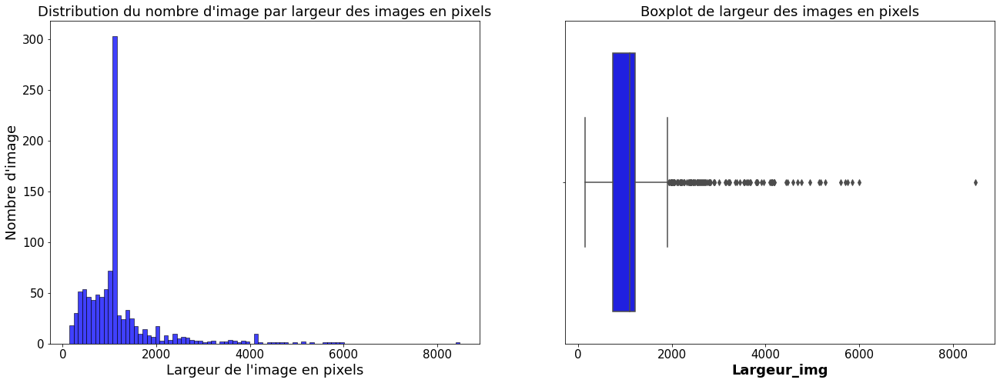

In [622]:
plt.figure(figsize = (22, 17))

plt.subplot(2, 2, 1)

plt.xticks(size = 15)
plt.title("Distribution du nombre d'image par largeur des images en pixels",size = 18)
#plt.xlim(0, 8500)
plt.xlabel("Largeur de l'image en pixels",size = 18)
plt.ylabel("Nombre d'image",size = 18)
sns.histplot(df_cat['Largeur_img'], color='blue')

plt.subplot(2, 2, 2)
plt.xticks(size = 15)
plt.xlabel("Largeur de l'image", weight='bold', size=18)
plt.title('Boxplot de largeur des images en pixels',size = 18)
sns.boxplot(df_cat['Largeur_img'], color='blue')
plt.savefig('largeur images',dpi=200, bbox_inches='tight')
plt.show()


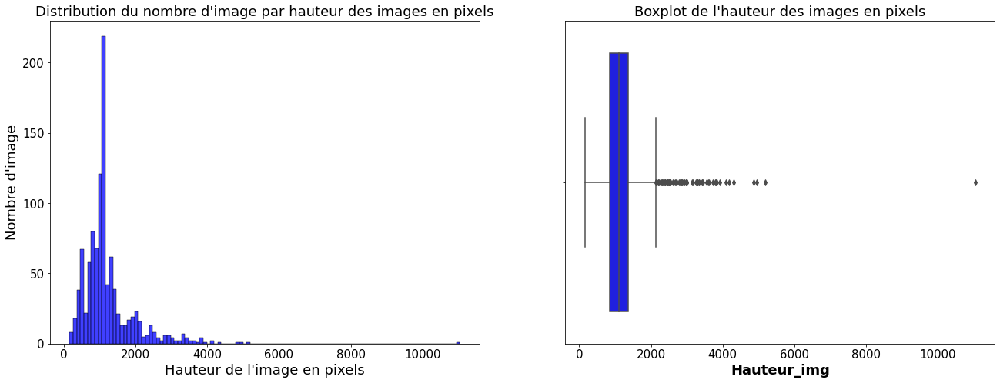

In [624]:
plt.figure(figsize = (22, 17))

plt.subplot(2, 2, 1)

plt.xticks(size = 15)
plt.title("Distribution du nombre d'image par hauteur des images en pixels",size = 18)
#plt.xlim(0, 8500)
plt.xlabel("Hauteur de l'image en pixels",size = 18)
plt.ylabel("Nombre d'image",size = 18)
sns.histplot(df_cat['Hauteur_img'], color='blue')

plt.subplot(2, 2, 2)
plt.xticks(size = 15)
plt.xlabel("Hauteur de l'image en pixels", weight='bold', size=18)
plt.title("Boxplot de l'hauteur des images en pixels",size = 18)
sns.boxplot(df_cat['Hauteur_img'], color='blue')
plt.savefig('hauteur images',dpi=200, bbox_inches='tight')
plt.show()


In [625]:
# Format des images
df_cat['Format_img'] = [Image.open(row).mode for row in df_cat['image_loc']]

In [632]:
df_cat.groupby('Format_img', as_index=False)['image'].count()

,Format_img,image
0,RGB,1050


Les images sont toutes en format couleurs et leurs tailles sont très inégales. Il faut les uniformiser en les redimensionnant pour pouvoir utiliser les réseaux de neurones et les CNN Transfer learning.


## <font color="blue" id="section_4_1"> 4-1 Pré-traitement des images

Pour le pré-traitement d'images, on va tester les outils des 2 librairies : PIL (Pyhton Imaging Library) et OpenCV (Open Compute Vision). Le traitement sera effectué en plusieurs étapes :  
* Correction de l'exposition (étirement histogramme)
* Correction contraste (égalisation histogramme)
* Redimensionnement en 224 * 224    
* Conversion de RGB (couleurs) en niveaux de gris (pour Sift)    
* Suppression du bruit (Filtres) 

On selectionnera les techniques qui donneront les meilleurs résultats

### Pré-traitement sur une image


In [633]:
df_image = df_cat[['product_name', 'image', 'image_loc', 'categories']]
df_image.head()

,product_name,image,image_loc,categories
0,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,C:\Users\MyPc\Desktop\reconversionProf\webinar...,Home Furnishing
1,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,C:\Users\MyPc\Desktop\reconversionProf\webinar...,Baby Care
2,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,C:\Users\MyPc\Desktop\reconversionProf\webinar...,Baby Care
3,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,C:\Users\MyPc\Desktop\reconversionProf\webinar...,Home Furnishing
4,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,C:\Users\MyPc\Desktop\reconversionProf\webinar...,Home Furnishing


- L'histogramme d'une image numérique est une courbe statistique représentant la répartition de ses pixels selon leur intensité. Pour une image en noir et blanc, il indique en abscisse le niveau de gris (entier entre 0 et 255) et en ordonnée, le nombre de pixels ayant cette valeur.
- Un histogramme cumulé normalisé calcule le pourcentage de pixels ayant une valeur inférieure à un niveau de gris donné
(Source cours OC )

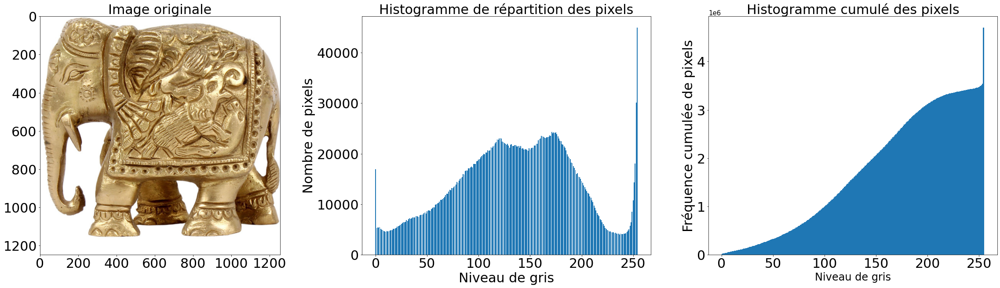

In [650]:
# Chargement de l'image 

img_orig = Image.open(df_image ['image_loc'][208])
afficher_image_histopixel(img_orig, 'Image originale')
plt.savefig('hist Image originale ex',dpi=200, bbox_inches='tight')
plt.show()

Image sur-exposée ==> histogramme concentré à droite vers les niveaux de gris faible (255 = blanc, image trop claire).   
Image sous-exposée ==> histogramme concentré à gauche vers les niveaux de gris fort (0 = noir, image trop sombre).

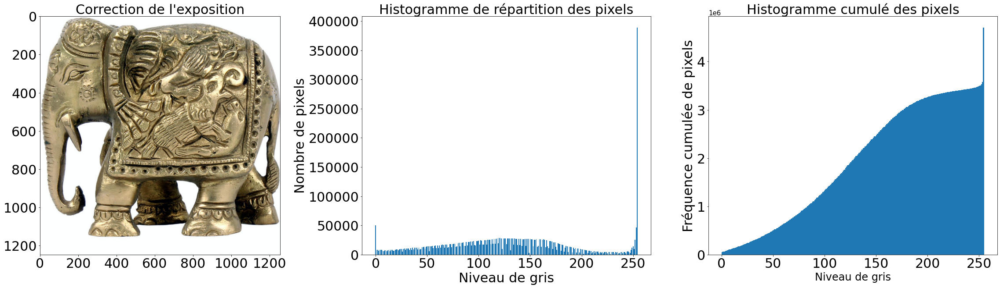

In [651]:
# Correction de l'exposition PIL (étirement histogramme)
img_expo = ImageOps.autocontrast(img_orig, 1)
afficher_image_histopixel(img_expo, "Correction de l'exposition")
plt.savefig('hist correction exposition ex',dpi=200, bbox_inches='tight')
plt.show()

### Correction de contraste (égalisation histogramme)

Le contraste caractérise la répartition de lumière dans une image : plus une image est contrastée, plus la différence de luminosité entre ses zones claires et sombres est importante. En général, une image peu contrastée est terne, tandis qu'une image trop contrastée est visuellement "agressive". Dans les deux cas, l'image manque de clarté car certains de ses détails seront peu, voire pas du tout, visibles. (source cours OC)

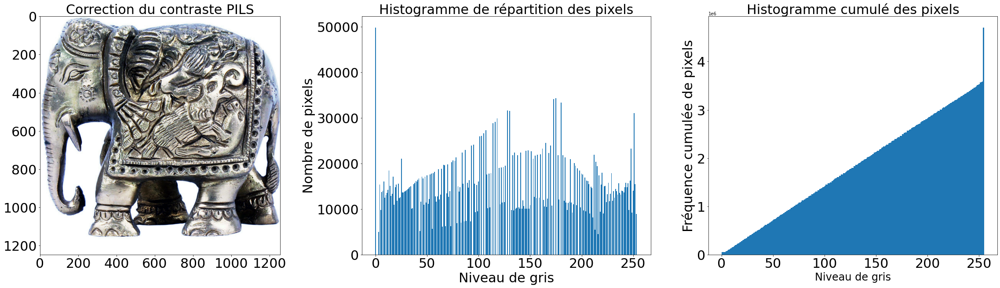

In [42]:
# Correction du contraste PILS
img_contr_pils = ImageOps.equalize(img_expo)
afficher_image_histopixel(img_contr_pils,'Correction du contraste PIL')
plt.savefig('hist correction contrast PILS ex',dpi=200, bbox_inches='tight')
plt.show()

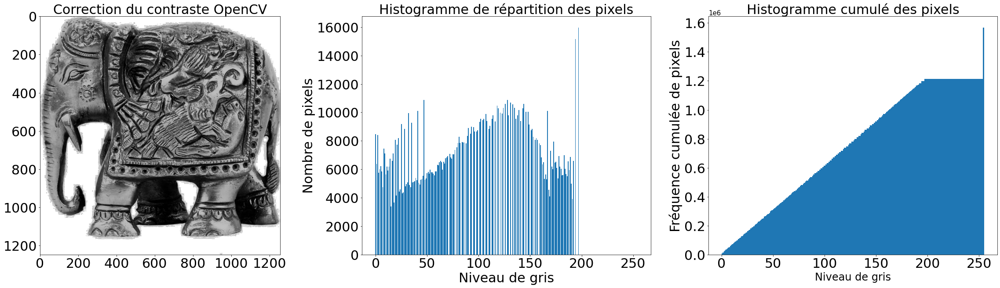

In [652]:
# Correction du contraste OpenCV méthode 1 : equalizeHist
img_expo_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
img_contr_opencv = cv2.equalizeHist(img_expo_gris)
afficher_image_histopixel(img_contr_opencv, 'Correction du contraste OpenCV')
plt.savefig('hist correction contrast opcv EQhis ex',dpi=200, bbox_inches='tight')
plt.show()

CLAHE (Contrast Limited Adaptive Histogram Equalization) : l'image est divisée en petits blocs appelés "tiles" (tileSize est 8x8 par défaut dans OpenCV). Chacun de ces blocs est égalisé en histogramme comme d'habitude. Ainsi, dans une petite zone, l'histogramme se limitera à une petite région (sauf s'il y a du bruit). Si le bruit est présent, il sera amplifié. Pour éviter cela, une limitation du contraste est appliquée. Si une case de l'histogramme est au-dessus de la limite de contraste spécifiée (par défaut 40 dans OpenCV), ces pixels sont coupés et distribués uniformément aux autres cases avant d'appliquer l'égalisation de l'histogramme. Après l'égalisation, l'interpolation bilinéaire est appliquée pour supprimer les artefacts sur les bords des 'tiles'. (Source opencv)

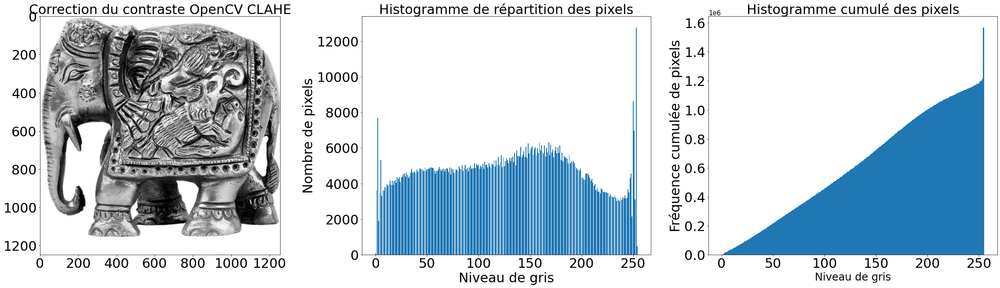

In [656]:
# Correction du contraste OpenCV méthode 2 : CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
img_contr_clahe = clahe.apply(img_expo_gris)
afficher_image_histopixel(img_contr_clahe,'Correction du contraste OpenCV CLAHE')
plt.savefig('hist correction contrast opcv clahe ex',dpi=200, bbox_inches='tight')
plt.show()

La correction du contraste OpenCV avec méthode CLAHE donne un histogramme cumulé plus régulier, il sera utilisé dans le cadre du pré-traitement sur toutes les images.

### Redimensionnement en 224 * 224
En entrées des réseaux de neurones, les images doivent avoir la taille 224 * 224

In [661]:
dim = (224, 224)

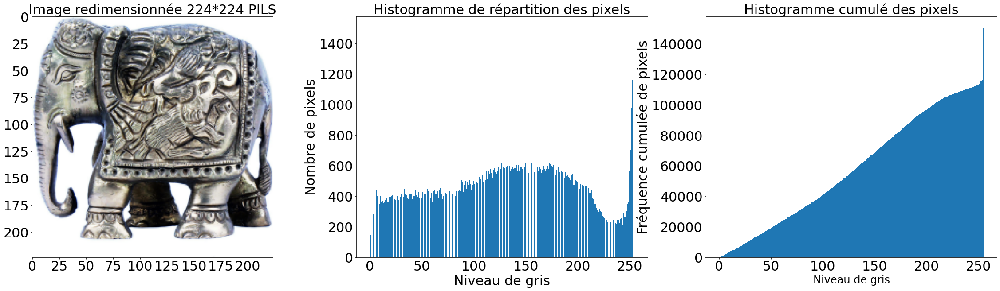

In [662]:
# Redimensionnement image contraste PILS
img_redim_pils = cv2.resize(np.array(img_contr_pils), dim,
                            interpolation=cv2.INTER_AREA)
afficher_image_histopixel(img_redim_pils,'Image redimensionnée 224*224 PILS')
plt.savefig('hist redimensionner pils contrast ex',dpi=200, bbox_inches='tight')
plt.show()

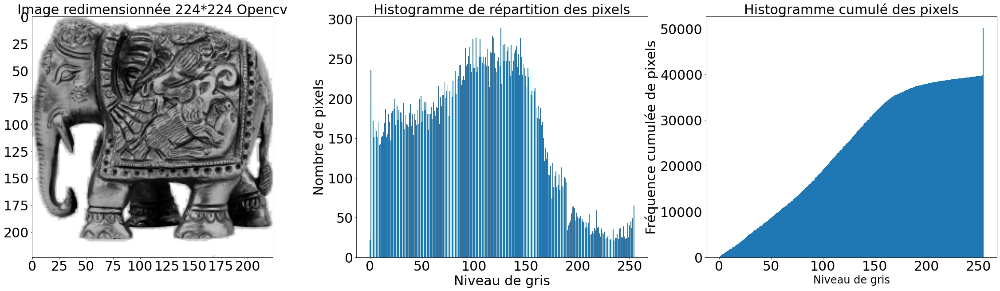

In [663]:
# Redimensionnement image contraste OpenCV
img_redim_opencv = cv2.resize(np.array(img_contr_opencv), dim,
                              interpolation=cv2.INTER_AREA)
afficher_image_histopixel(img_redim_opencv,'Image redimensionnée 224*224 Opencv')
plt.savefig('hist redimensionner ocv contrast ex',dpi=200, bbox_inches='tight')
plt.show()

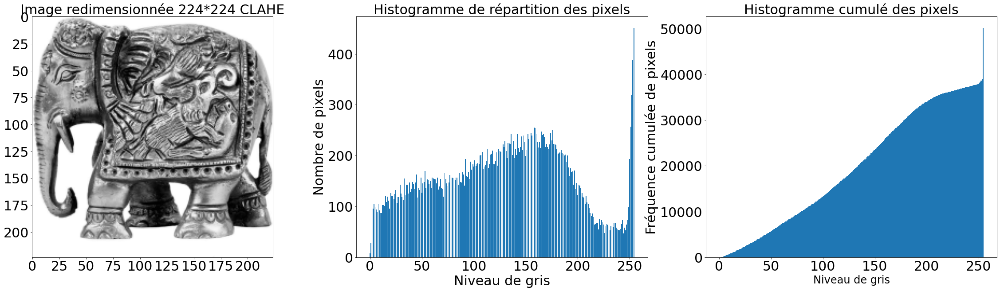

In [664]:
# Redimensionnement image contraste OpenCV CLAHE
img_redim_clahe = cv2.resize(np.array(img_contr_clahe), dim,
                             interpolation=cv2.INTER_AREA)
afficher_image_histopixel(img_redim_clahe,'Image redimensionnée 224*224 CLAHE')
plt.savefig('hist redimensionner clahe contrast ex',dpi=200, bbox_inches='tight')
plt.show()

### Convertir l'image en niveau de gris

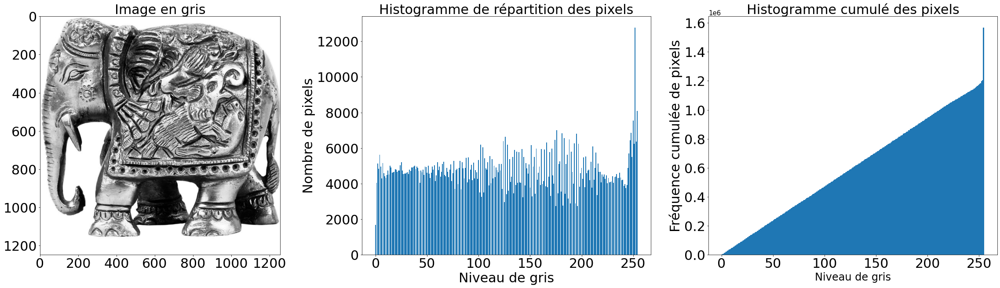

In [657]:
# Conversion de l'image en niveau de gris pour SIFT
img_gris = cv2.cvtColor(np.array(img_contr_pils), cv2.COLOR_RGB2GRAY)
afficher_image_histopixel(img_gris, 'Image en gris')
plt.savefig('hist conversion gris pils contrast ex',dpi=200, bbox_inches='tight')
plt.show()

### Réduction du bruit
 
Pour améliorer la qualité des images, on va tester 3 différents filtres :  
- Un filtre linéaire gaussien dont les éléments du noyau de convolution sont déterminés selon la densité d'une loi gaussienne centrée à 2 dimensions)
- Un filtre Non-local Means Denoising qui réalise une moyenne de la totalité des valeurs des pixels contenus dans l'image, pondérées en fonction de leur similarité avec le pixel cible  

#### Réduction du bruit par un filtre gaussien 

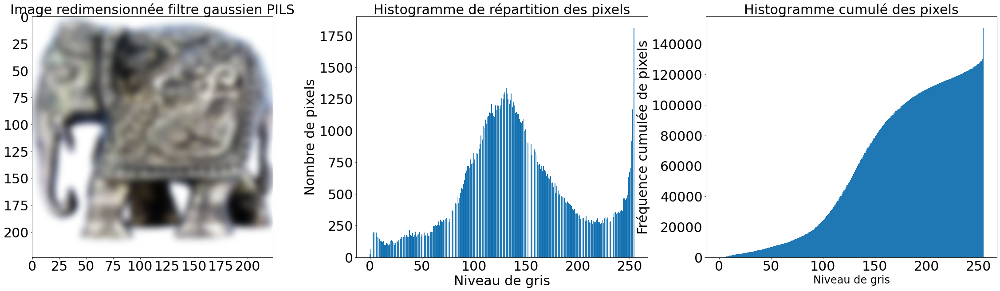

In [665]:
# Réduction du bruit filtre gaussien sur image correction contraste PILS
img_redim_pils_rgb = Image.fromarray(img_redim_pils, 'RGB')
img_gaus_pils = img_redim_pils_rgb.filter(ImageFilter.GaussianBlur(radius=3))
afficher_image_histopixel(img_gaus_pils,'Image redimensionnée filtre gaussien PILS')
plt.savefig('hist gaussien pils filtre-cont pils ex',dpi=200, bbox_inches='tight')
plt.show()

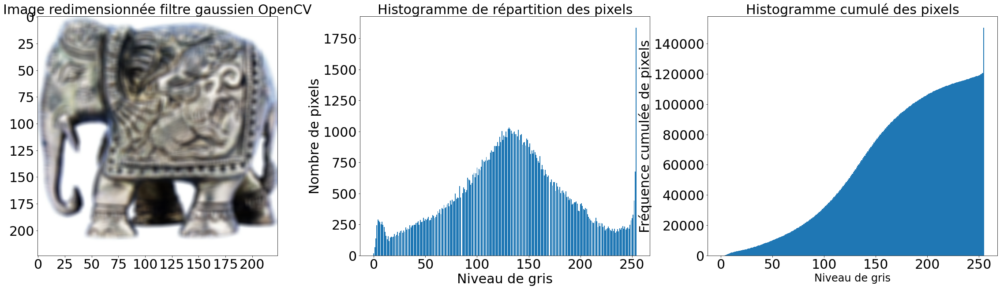

In [667]:
# Réduction du bruit filtre gaussien sur image correction contraste opencv
img_gaus_pils = cv2.GaussianBlur(img_redim_pils, (5, 5), cv2.BORDER_DEFAULT)
afficher_image_histopixel(img_gaus_pils,'Image redimensionnée filtre gaussien OpenCV')
plt.savefig('hist gaussien pils filtre-cont pils ex',dpi=200, bbox_inches='tight')
plt.show()

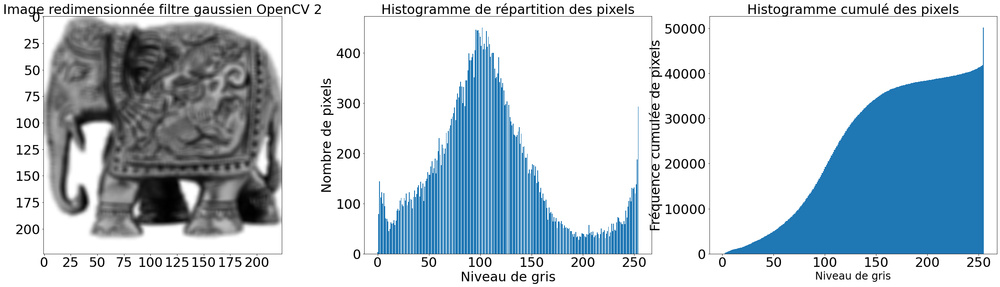

In [668]:
# Réduction du bruit filtre gaussien sur image correction contraste OpenCV
img_gaus_opencv = cv2.GaussianBlur(img_redim_opencv, (5, 5),
                                   cv2.BORDER_DEFAULT)
afficher_image_histopixel(img_gaus_opencv,'Image redimensionnée filtre gaussien OpenCV 2')
plt.savefig('hist gaussien pils filtre-cont pils ex',dpi=200, bbox_inches='tight')
plt.show()

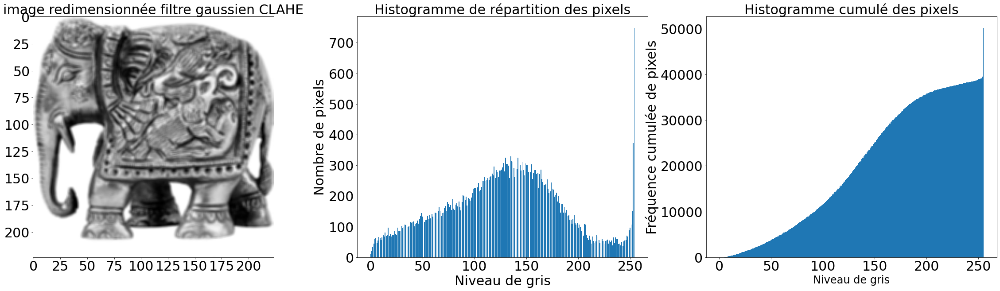

In [669]:
# Réduction du bruit filtre gaussien sur image correction contraste OpenCV
img_gaus_clahe = cv2.GaussianBlur(img_redim_clahe, (3, 3), cv2.BORDER_DEFAULT)
afficher_image_histopixel(img_gaus_clahe, 'image redimensionnée filtre gaussien CLAHE')
plt.savefig('hist gaussien filtre-cont clahe ex',dpi=200, bbox_inches='tight')
plt.show()

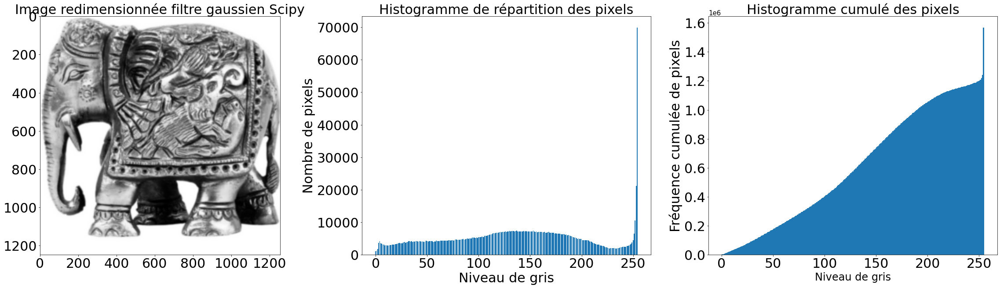

In [670]:
img_gaus_scipy = gaussian_filter(img_gris, sigma=3)
afficher_image_histopixel(img_gaus_scipy, 'Image redimensionnée filtre gaussien Scipy')
plt.savefig('hist gaussien Scipy filtre-gray-cont pils ex',dpi=200, bbox_inches='tight')
plt.show()

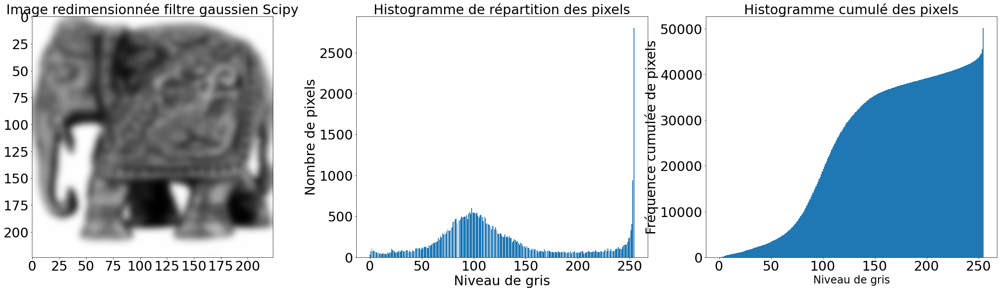

In [671]:
img_gaus_scipy2 = gaussian_filter(img_redim_opencv, sigma=3)
afficher_image_histopixel(img_gaus_scipy2,'Image redimensionnée filtre gaussien Scipy')
plt.savefig('hist gaussien Scipy filtre-redim-cont ocv ex',dpi=200, bbox_inches='tight')
plt.show()

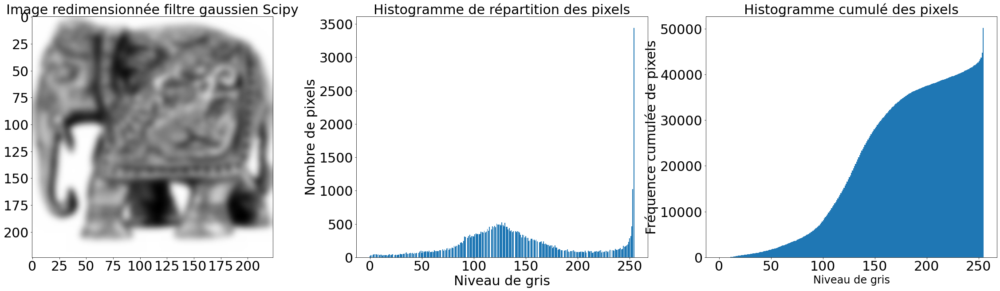

In [672]:
img_gaus_scipy2 = gaussian_filter(img_redim_clahe, sigma=3)
afficher_image_histopixel(img_gaus_scipy2,'Image redimensionnée filtre gaussien Scipy')
plt.savefig('hist gaussien Scipy filtre-redim-cont clahe ex',dpi=200, bbox_inches='tight')
plt.show()


#### Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV

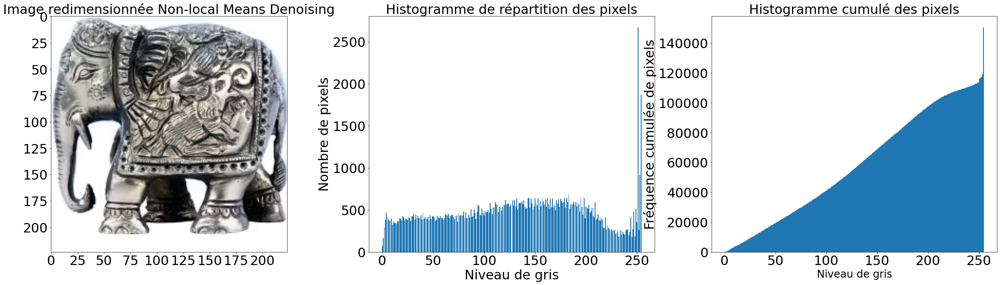

In [673]:
# Réduction du bruit avec l'algorithme  Non-local Means Denoising d'OpenCV (from image pils)
img_fast_pils = cv2.fastNlMeansDenoisingColored(img_redim_pils, None, 5, 5, 7,21)
afficher_image_histopixel(img_fast_pils,'Image redimensionnée Non-local Means Denoising')
plt.savefig('hist NLMD filtre-redim-cont pils ex',dpi=200, bbox_inches='tight')
plt.show()

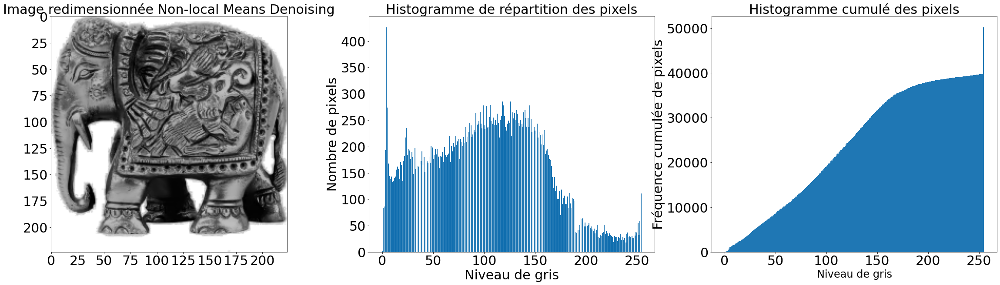

In [674]:
# Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV (pre traitement ocv)
img_fast_opencv = cv2.fastNlMeansDenoising(img_redim_opencv, None, 5, 7, 21)
afficher_image_histopixel(img_fast_opencv,'Image redimensionnée Non-local Means Denoising')
plt.savefig('hist NLMD filtre-redim-cont ocv ex',dpi=200, bbox_inches='tight')
plt.show()

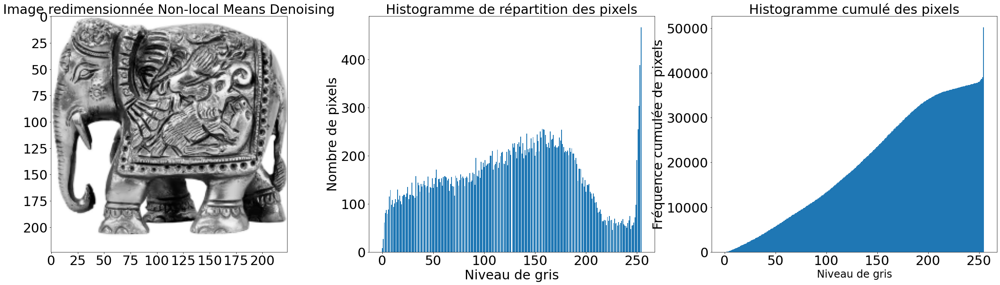

In [675]:
# Non-local Means Denoising d'OpenCV (pre traitement clahe)
img_fast_clahe = cv2.fastNlMeansDenoising(img_redim_clahe, None, 5, 7, 21)
afficher_image_histopixel(img_fast_clahe,'Image redimensionnée Non-local Means Denoising')
plt.savefig('hist NLMD filtre-redim-cont clahe ex',dpi=200, bbox_inches='tight')
plt.show()

### Bilan des différents tests

Le bilan des différents tests realisés ci-dessus nous amene a sélectionner le pré-traitement suivant qui sera appliqué sur toutes les images :   
 
* Correction de l'exposition (étirement d'histogramme) avec PILS (autocontrast)   
* Correction du contraste (égalisation d'histogramme) avec OpenCV (CLAHE (Contrast Limited Adaptive Histogram Equalization)  
* Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV  (img_redim_pils)
* Conversion en niveau de gris de l'image (pour SIFT)   
* Réduction de dimension avec OpenCV (resize et interpolation INTER_AREA)   (img_contr_pils)

###  Pré-traitement de toutes les images

In [677]:
# dataframe avec les images traités
df_image_t = df_image.copy()

In [687]:
df_image_t['image_proces'] = df_image_t['image_loc'].apply(preprocess_image)

## <font color="blue" id="section_4_2"> 4-2- Bag of Visual Words (BoVW): Scale-Invariant Feature Transform (SIFT)

#### Processus pour classer les images par BoVW 
- La technique de BoVW ou sacs de mots visuels permet d'extraire les éléments les plus importants qui se détachent de l'image. Ces éléments sont les "features" ou points clés.  
- A chaque feature est associé un vecteur qui décrit le voisinage de la feature à laquelle il est associé, ce sont les "descripteurs".  
- Les éléments similaires des descripteurs sont ensuite regroupés dans des clusters par un algorithme non supervisé. Chaque cluster contient des bouts d'images similaires présentent dans différentes images. Elles sont donc assimilables à des mots dans un texte d'où le nom de 'mot visuel'.   
- Les images contiennent des proportions différentes de ces mots visuels, ce qui permet de trouver une similitude entre les images ayant des proportions proches de ces mots visuels.   

#### Features extraction par SIFT


SIFT permet d'extraire les features de l'image et de calculer leurs descripteurs.    
* L'algorithme SIFT se divise en plusieurs étapes :    
- Détection : création de l'espace des échelles, calcul des "DoG" (Différence of Gaussian), localisation des points d'intérêt.
- Description : assignation d'orientation, création des descripteurs.
- Les méthodes utilisées pour l'algorithme SIFT sont extraites d'OpenCV  
(Source OC)

### Extraction des features via SIFT : exemple sur une image

In [703]:
# Chargement de l'image précédemment traitée

eleph = cv2.imread('C:\\Users\\MyPc\\Desktop\\reconversionProf\\webinaropenclassroom\\Projets\\P6\\Flipkart\\Images\\Images_process/55ce1309b69e1912d2fd60a3ee3f351b.jpg')

# Transformation de l'image en matrice de pixels 
eleph = np.array(eleph)

# Instanciation de SIFT
sift = cv2.SIFT_create()

# Extraction des points d'intérêt et des descripteurs
sift_keypoints, sift_descripteurs = sift.detectAndCompute(eleph, None)
#nb_feat = sift_keypoints
nb_feat = sift_descripteurs.shape[0]
nb_desc = sift_descripteurs.shape[1]
print(f'SIFT Eleph - Nombre de features={nb_feat} pour {nb_desc} descripteurs')


SIFT Eleph - Nombre de features=776 pour 128 descripteurs


In [693]:
sift_descripteurs

array([[ 11.,   7.,   7., ...,   0.,   0.,   0.],
       [ 18.,   2.,   1., ...,   0.,   0.,   2.],
       [ 20.,  10.,   4., ...,   0.,   0.,   0.],
       ...,
       [ 38.,   5.,   1., ...,   0.,   0.,   2.],
       [ 64.,   5.,   9., ...,   0.,   0.,   8.],
       [130.,   8.,   0., ...,   0.,   0.,   0.]], dtype=float32)

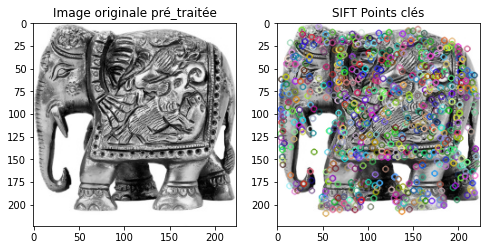

In [67]:
# Visualisation des points d'intérêt
sift_eleph_keypoints = cv2.drawKeypoints(eleph, sift_keypoints, None)

plt.figure(figsize=(8, 4))

# Image originale
plt.subplot(1, 2, 1)
plt.title('Image originale pré_traitée')
plt.imshow(eleph)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.imshow(sift_eleph_keypoints)
plt.title('SIFT Points clés')
plt.savefig('elephant pre traite et pts cles',dpi=200, bbox_inches='tight')
plt.show()

### SIFT pour les 1050 images du jeu de données

In [698]:
# Chargement des images pré-traitées dans le dictionnaire images
dico_images = charger_image_repertoire(r"C:\Users\MyPc\Desktop\reconversionProf\webinaropenclassroom\Projets\P6\Flipkart\Images\Images_process")
print(f'{len(dico_images)} images chargées')

1050 images chargées


### ÉTAPE 1 - Extraction des features - Visual Words

In [699]:
sifts = sift_extraire_features(dico_images)

In [709]:
# Liste des descripteurs
sift_list_descripteurs = sifts[0]
len(sift_list_descripteurs)

334132

In [710]:
# Liste des vecteurs par images 
sift_all_bovw_features = sifts[1]
len(sift_all_bovw_features)

1050

### ETAPE 2 - Création du dictionnaire de visual words : Bag of Visual Words (BoVW) 
Pour le faire, on va appliquer un algorithme de clustering aux descripteurs de features construits  
Les visual words correspondent alors aux centres des clusters trouvés.  
je vais utiliser MinibatchKmeans qui est rapide (on gagne une heure par rapport au kmeans)


On va chercher k optimal (nombre de clusters) avec la methode Elbow

In [711]:
# Initialisation du dataframe de sauvegarde des métriques kmeans
df_kmeans_metrics = pd.DataFrame({})
nb_clusters = [100, 300, 500, 1000, 2000, 3000, 4000, 5000]

df_kmeans_metrics = calcul_metrics_kmeans(sift_list_descripteurs,
                                        df_kmeans_metrics,
                                        'SIFT', nb_clusters)

'Paramètre 100 terminé'

'Paramètre 300 terminé'

'Paramètre 500 terminé'

'Paramètre 1000 terminé'

'Paramètre 2000 terminé'

'Paramètre 3000 terminé'

'Paramètre 4000 terminé'

'Paramètre 5000 terminé'

### Méthode Elbow

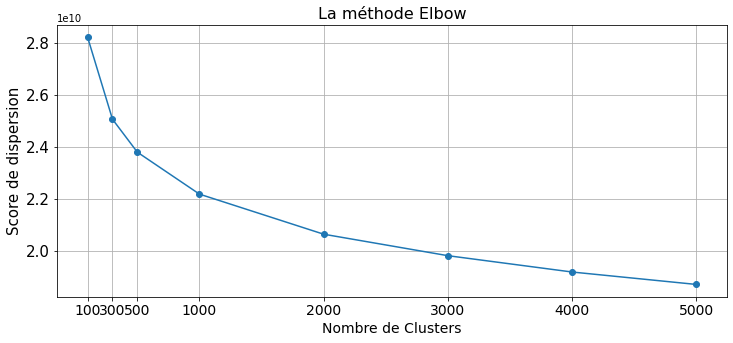

In [116]:
# Trace le graphique des dispersions, pour visualiser le coude

plt.figure(figsize=(12, 5))

plt.title('La méthode Elbow', fontsize=16)
plt.plot([i for i in nb_clusters],
         df_kmeans_metrics['dispersion'].to_list(),
         marker='o')
plt.grid(True)
plt.xlabel('Nombre de Clusters', fontsize=14)
plt.ylabel('Score de dispersion', fontsize=15)
plt.xticks([i for i in nb_clusters], fontsize=14)
plt.yticks(fontsize=15)
plt.savefig('Elbow method inertia k optimal',dpi=200, bbox_inches='tight')
plt.show()

Selon la courbe, le nombre de cluster optimal de l'algorithme kmeans (k) est 1000 (point correpondant au coude)

In [713]:
# Creation des clusters via MiniBatch et Constitution du dictionnaire de bag of words
sift_kmeans = MiniBatchKMeans(n_clusters=1000,
                     random_state=0, n_init=10)
sift_kmeans.fit(sift_list_descripteurs)
sift_visual_words = sift_kmeans.cluster_centers_

In [466]:
sift_visual_words

array([[18.0490566 , 16.91698113, 18.99245283, ...,  6.17735849,
        42.06037736, 93.06792453],
       [29.95823096, 15.14496314, 12.39312039, ..., 29.01474201,
         3.84520885,  3.65601966],
       [12.86781609,  9.81034483, 12.38793103, ..., 42.1408046 ,
        13.61206897, 12.8591954 ],
       ...,
       [39.28444444, 43.09333333, 35.38666667, ..., 15.30222222,
        14.04888889, 10.44      ],
       [30.04651163, 17.29844961, 13.09302326, ..., 14.10077519,
        93.21317829, 93.3875969 ],
       [ 8.92569659,  6.08049536, 13.15479876, ..., 14.20123839,
        11.75541796, 23.79256966]])

### ÉTAPE 4 - Construction de l'histogramme pour chaque image

In [714]:
sift_bovw = image_class(sift_all_bovw_features, sift_visual_words)

In [106]:
len(sift_bovw)

1050

In [716]:
# Dataframe  des BoVW SIFT
df_sift_bovw = pd.DataFrame({'image': sift_bovw.keys(),'sift_bovw': sift_bovw.values()})

# Ajout des BOVW en np.array d'une liste
df_sift_bovw['Histo'] = [row[0] for row in df_sift_bovw['sift_bovw']] 
# Ajout de la catégorie
df_sift_bovw = df_sift_bovw.merge(df_image_t[['image', 'image_loc',
                                        'categories']], how='left', on='image')

# Constituer le dataframe de vecteurs de BOVW
df_sift_vectors = constituer_dataframe_vectors(df_sift_bovw, 'Histo')

In [717]:
df_sift_bovw.head(2)

,image,sift_bovw,Histo,image_loc,categories
0,009099b1f6e1e8f893ec29a7023153c4.jpg,"[[0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, ...",C:\Users\MyPc\Desktop\reconversionProf\webinar...,Watches
1,0096e89cc25a8b96fb9808716406fe94.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",C:\Users\MyPc\Desktop\reconversionProf\webinar...,Kitchen & Dining


In [117]:
df_sift_vectors

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,...,0.0,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,5.0,0.0,0.0,1.0
4,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1046,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,1.0,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1047,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1048,2.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,2.0,0.0


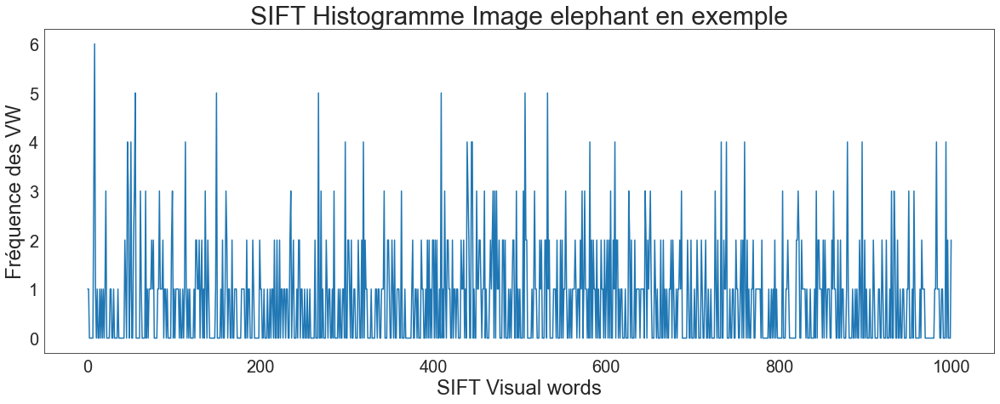

In [492]:
# Visualisation de l'histogramme pour l'image exemple de l'elephant

# Récupération de l'historgramme
df_visu = df_sift_bovw[df_sift_bovw['image'] ==
                       '55ce1309b69e1912d2fd60a3ee3f351b.jpg']['sift_bovw']   
histo_eleph = df_visu.to_list()[0][0]
plt.figure(figsize=(20, 7))
plt.title('SIFT Histogramme Image elephant en exemple', fontsize=30)
plt.xlabel("SIFT Visual words", fontsize=24)
plt.ylabel("Fréquence des VW", fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_eleph)
plt.savefig('histogram elephant',dpi=200, bbox_inches='tight')
plt.show()

### ÉTAPE 5 - Réduction de dimension

In [281]:
df_sift_vectors.shape[1]

1000

nombre de features après reduction ACP pour 99% de variance : 543
-----------------------------------------
 coefficient de silhouette : 0.37070000171661377
 ARI  : 0.0039
-----------------------------------------


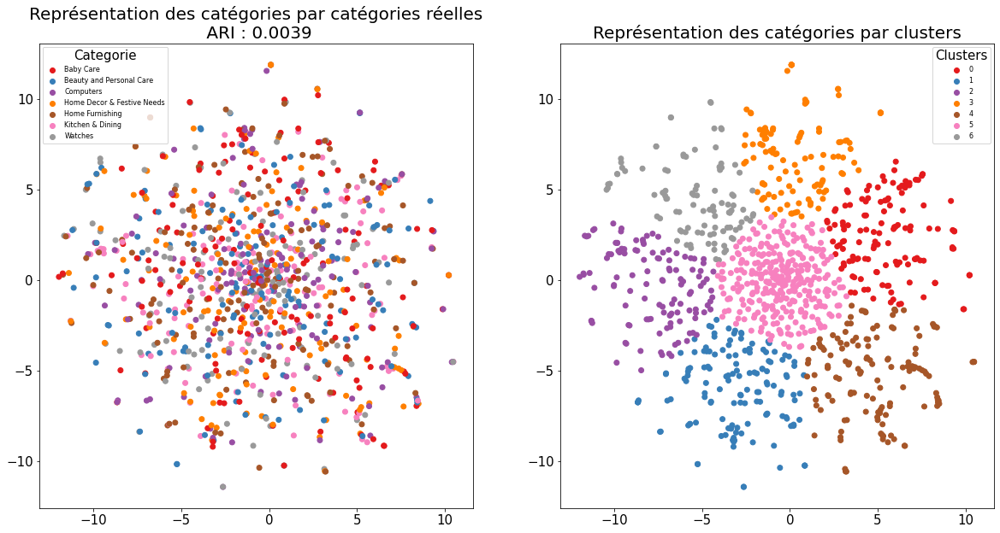

In [720]:
# Reduction ACP/TSNE/Kmeans/visualisation

# reduction ACP (99% de variance)
df_sift_vectors_acp = acp(df_sift_vectors)

# Calcul des composantes TSNE

df_sift_vectors_acp_tsne = tsne(df_sift_vectors_acp, 40)

# kmeans
df_sift_vectors_acp_tsne_km, ARI, labels = kmeans(df_sift_vectors_acp_tsne, df_categories)

# visualisation
TSNE_visu_fct(df_sift_vectors_acp_tsne_km, labels, ARI)
plt.savefig('SIFT-kmeans-tsne-cat reelles',dpi=200, bbox_inches='tight')


In [721]:
# Les catégories par clusters
df_sift_vectors_acp_tsne_km.groupby('cluster_id')['categories'].value_counts().to_frame()

categories
cluster_id categories                            
0          Computers                           22
           Beauty and Personal Care            21
           Home Furnishing                     21
           Kitchen & Dining                    18
           Watches                             18
           Baby Care                           17
           Home Decor & Festive Needs          14
1          Home Decor & Festive Needs          26
           Watches                             24
           Beauty and Personal Care            21
           Home Furnishing                     20
           Computers                           18
           Kitchen & Dining                    18
           Baby Care                           14
2          Kitchen & Dining                    25
           Watches                             20
           Home Furnishing                     19
           Baby Care                           17
           Beauty and Personal Care            17
           Computers                           12
           Home Decor & Festive Needs          11
3          Baby Care                           24
           Home Furnishing                     22
           Computers                           16
           Home Decor & Festive Needs          14
           Watches                             14
           Beauty and Personal Care            12
           Kitchen & Dining                    11
4          Baby Care                           27
           Home Decor & Festive Needs          25
           Kitchen & Dining                    19
           Beauty and Personal Care            18
           Computers                           18
           Home Furnishing                     17
           Watches                             14
5          Computers                           57
           Kitchen & Dining                    55
           Beauty and Personal Care            44
           Watches                             44
           Home Decor & Festive Needs          40
           Home Furnishing                     34
           Baby Care                           33
6          Home Decor & Festive Needs          20
           Baby Care                           18
           Beauty and Personal Care            17
           Home Furnishing                     17
           Watches                             16
           Computers                            7
           Kitchen & Dining                     4

,precision,recall,f1-score,support
0,0.203187,0.340000,0.254364,150.000000
1,0.000000,0.000000,0.000000,150.000000
2,0.180365,0.526667,0.268707,150.000000
3,0.191667,0.306667,0.235897,150.000000
4,0.000000,0.000000,0.000000,150.000000
5,0.206612,0.166667,0.184502,150.000000
6,0.000000,0.000000,0.000000,150.000000
accuracy,0.191429,0.191429,0.191429,0.191429
macro avg,0.111690,0.191429,0.134782,1050.000000
weighted avg,0.111690,0.191429,0.134782,1050.000000


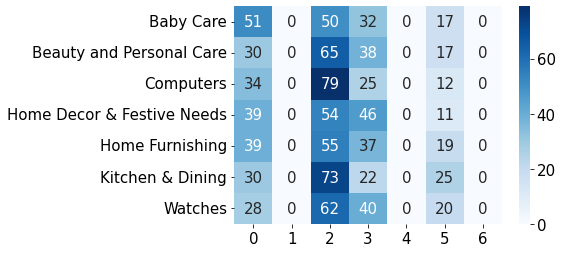

In [722]:

conf_mat_metrics(df_sift_vectors_acp_tsne_km)
plt.savefig('confusion matrix SIFT',dpi=200, bbox_inches='tight')
plt.show()

La visualisation ainsi que l'indice de similarité montrent clairement qu'on arrive pas à séparer les catégories et par conséquent les classifier en utilisant l'algorithme SIFT pour l'extraction des features des images et le calcul des descripteurs

## <font color="blue" id="section_4_3"> 4-3- Convolutional Neural Networks (CNN) transfer learning 

Les réseaux de neurones convolutifs ont une méthodologie similaire à celle des méthodes traditionnelles d'apprentissage supervisé : ils reçoivent des images en entrée, détectent les features de chacune d'entre elles, puis entraînent un classifieur dessus.   
Les CNN réalisent eux-mêmes tout le boulot fastidieux d'extraction et description de features : lors de la phase d'entraînement, l'erreur de classification est minimisée afin d'optimiser les paramètres du classifieur et les features. [Source cours OC]

### <font color="blue" id="section_4_3_1"> 4-3-1- VGG16
Dans cette partie, on va réaliser un transfer learning via le réseau VGG16 préentrainé sur une base d'image riche (imageNet)-plus d'un million.  

VGG16 est une version du réseau de neurones convolutif VGG-Net. Il est constitué de 16 couches, dont 13 couches de convolution et 3 fully-connected. Il doit donc apprendre les poids de 16 couches.
Il prend en entrée une image en couleurs de taille 224 × 224 px et la classifie dans une des 1000 classes. Il renvoie donc un vecteur de taille 1000, qui contient les probabilités d'appartenance a chacune des classes [Source openclassrooms]
    On va utiliser la partie le code convolutif pour extraire les features (13 couches de convolution) sans utiliser les 3 fully-connected couches

### ÉTAPE 1 - Chargement des image et extraction des features


In [723]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine non traitées

top_depart = time.time()

# Liste
vgg16_all_features = []

# Pre-Trained Model as Feature Extractor in Model

model_vgg16  = VGG16(weights='imagenet', include_top=False,  classes=7, pooling='avg', input_shape=(224,224,3)) 

# Résumé de l'architecture du modèle
model_vgg16.summary()

for rep_image in df_image_t['image_loc']:

    # Charger l'image et la redimensionner à la taille requise de 224×224 pixels
    img = image.load_img(rep_image, target_size=(224, 224))
    
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler dans Keras
    img = image.img_to_array(img)
    
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    
    # Préparer de nouvelles entrées pour le réseau
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance de l'image à chacun des 1000 types d'objets connus
    vgg16_feature = model_vgg16.predict(img)
    
    # Ajouter la feature prédite en nparray à la liste 
    vgg16_all_features.append(np.array(vgg16_feature).flatten()) # Conversion des matrices 3D en vecteur 1D

vgg16_all_features = np.array(vgg16_all_features)

print(f"Temps d'execution : {round((time.time()-top_depart)/60, 3)} minutes")

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

1/1 [==============================] - 0s 221ms/step


1/1 [==============================] - 0s 213ms/step


1/1 [==============================] - 0s 212ms/step


1/1 [==============================] - 0s 206ms/step


1/1 [==============================] - 0s 261ms/step


1/1 [==============================] - 0s 232ms/step


1/1 [==============================] - 0s 231ms/step
Temps d'execution : 4.961 minutes


In [724]:
vgg16_all_features.shape 

(1050, 512)

In [726]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
df_image_t['vgg16_bovw'] = [vgg16_all_features[i] for i in range(df_image_t.shape[0])]
# Dataframe de travail
df_vgg16_bovw = df_image_t[['image', 'image_loc', 'categories', 'vgg16_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)

### ÉTAPE 2 - Réduction de dimension

#### ACP/TSNE/kmeans 

nombre de features après reduction ACP pour 99% de variance : 351
-----------------------------------------
 coefficient de silhouette : 0.42980000376701355
 ARI  : 0.4148
-----------------------------------------


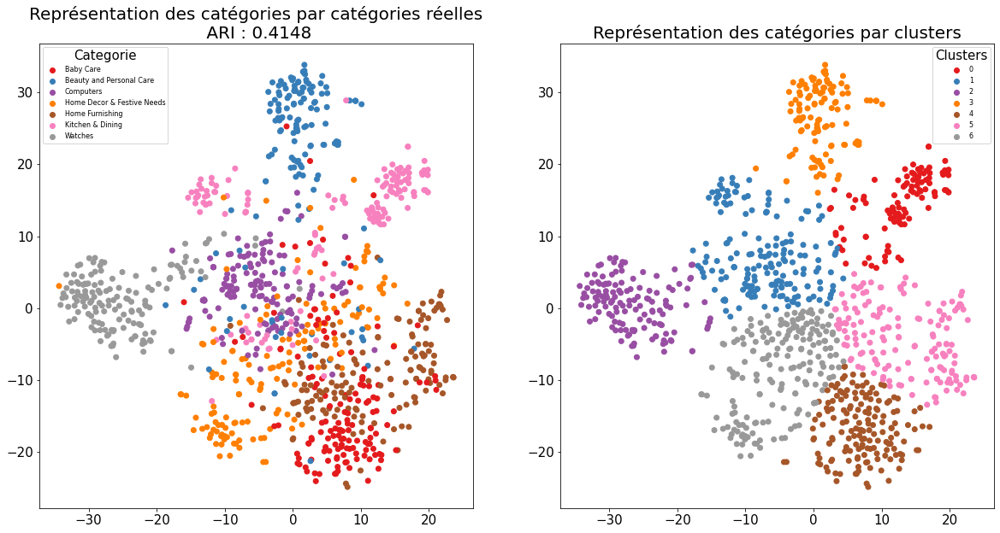

In [729]:
# Réduction ACP pour 99% de variance

df_vgg16_vectors_acp = acp(df_vgg16_vectors)

# Calcul des composantes TSNE.

df_vgg16_vectors_acp_tsne = tsne(df_vgg16_vectors_acp, 50)

# kmeans

df_vgg16_vectors_acp_tsnee_km, ARI, labels = kmeans(df_vgg16_vectors_acp_tsne, df_categories)

# Visualisation

TSNE_visu_fct(df_vgg16_vectors_acp_tsnee_km, labels, ARI)
plt.savefig('Vgg16-kmeans-acp-tsne-cat reelles',dpi=200, bbox_inches='tight')

#### Sans réduction ACP

-----------------------------------------
 coefficient de silhouette : 0.4375
 ARI  : 0.4881
-----------------------------------------


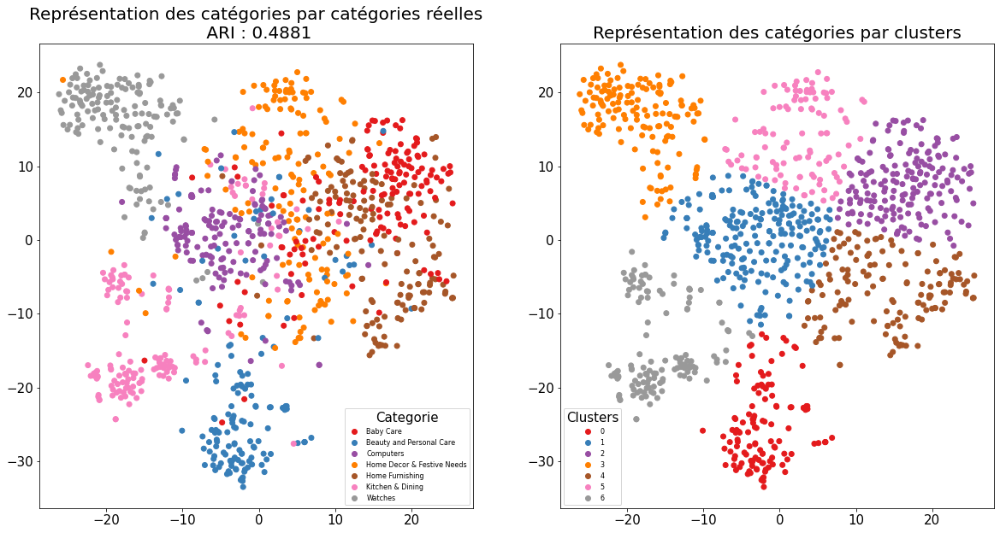

In [732]:
# Calcul des composantes TSNE

df_vgg16_vectors_tsne = tsne(df_vgg16_vectors, 50)

# kmeans

df_vgg16_vectors_tsne_km, ARI, labels = kmeans(df_vgg16_vectors_tsne, df_categories)

# visualisation

TSNE_visu_fct(df_vgg16_vectors_tsne_km, labels, ARI)
plt.savefig('Vgg16-kmeans-tsne-cat reelles',dpi=200, bbox_inches='tight')

#### Matrice de confusion 

,precision,recall,f1-score,support
0,0.586592,0.700000,0.638298,150.000000
1,0.926829,0.760000,0.835165,150.000000
2,0.562500,0.840000,0.673797,150.000000
3,0.714286,0.500000,0.588235,150.000000
4,0.527778,0.506667,0.517007,150.000000
5,0.899225,0.773333,0.831541,150.000000
6,0.945205,0.920000,0.932432,150.000000
accuracy,0.714286,0.714286,0.714286,0.714286
macro avg,0.737488,0.714286,0.716639,1050.000000
weighted avg,0.737488,0.714286,0.716639,1050.000000


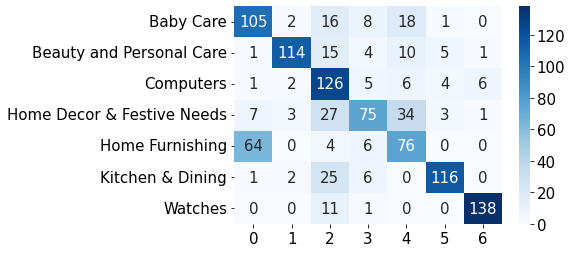

In [734]:
conf_mat_metrics(df_vgg16_vectors_tsne_km)
plt.savefig('confusion matrix vgg16',dpi=200, bbox_inches='tight')
plt.show()

### <font color="blue" id="section_4_3_2"> 4-3-2-InceptionV3
Dans cette partie, on va réaliser un transfer learning via InceptionV3 préentrainé sur une base d'image riche.
Inception v3 est un réseau de neurones convolutif destiné à aider à l'analyse d'images et à la détection d'objets, et a débuté comme module pour GoogLeNet. Il s'agit de la troisième édition du réseau de neurones convolutif Inception de Google.  
Il est constitué de 48 couches profondes. Il prend en entrée une image en couleurs de taille 299 × 299 px

### ÉTAPE 1 - Chargement des image et extraction des features

In [735]:
# Utilisation de InceptionV3 pré-entraîné sur ImageNet avec les images
# d'origine
# InceptionV3 imports
from keras.applications.inception_v3 import preprocess_input
from keras.applications import InceptionV3


top_depart = time.time()

# Liste
incep_all_features = []

# Instanciation du modèle
model_incep = InceptionV3(weights='imagenet', include_top=False,  pooling='avg')#classes=7,
# Résumé de l'architecture du modèle
model_incep.summary()

for rep_image in df_image_t['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 299x299 pixels. le redimensionnement 224x224 a donné meilleur resultat
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    incep_feature = model_incep.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    incep_all_features.append(np.array(incep_feature).flatten())

incep_all_features = np.array(incep_all_features)    
print(f"Temps d'execution : {round((time.time()-top_depart)/60, 3)} minutes")

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_16[0][0]']               
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                    

                                                                                                  
 average_pooling2d (AveragePool  (None, None, None,   0          ['max_pooling2d_1[0][0]']        
 ing2D)                         192)                                                              
                                                                                                  
 conv2d_5 (Conv2D)              (None, None, None,   12288       ['max_pooling2d_1[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   76800       ['activation_6[0][0]']           
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_18 (Conv2D)             (None, None, None,   16384       ['average_pooling2d_1[0][0]']    
                                64)                                                               
                                                                                                  
 batch_normalization_12 (BatchN  (None, None, None,   192        ['conv2d_12[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_normalization_14 (BatchN  (None, None, None,   192        ['conv2d_14[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_25 (BatchN  (None, None, None,   192        ['conv2d_25[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 activation_19 (Activation)     (None, None, None,   0           ['batch_normalization_19[0][0]'] 
                                64)                                                               
                                                                                                  
 activation_21 (Activation)     (None, None, None,   0           ['batch_normalization_21[0][0]'] 
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_36 (Conv2D)             (None, None, None,   114688      ['activation_35[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_31 (BatchN  (None, None, None,   384        ['conv2d_31[0][0]']              
 ormalization)                  128)                                                              
                                                                                                  
 batch_normalization_36 (BatchN  (None, None, None,   384        ['conv2d_36[0][0]']              
 ormalization)                  128)                                                              
          

 ormalization)                  160)                                                              
                                                                                                  
 activation_44 (Activation)     (None, None, None,   0           ['batch_normalization_44[0][0]'] 
                                160)                                                              
                                                                                                  
 conv2d_45 (Conv2D)             (None, None, None,   179200      ['activation_44[0][0]']          
                                160)                                                              
                                                                                                  
 batch_normalization_45 (BatchN  (None, None, None,   480        ['conv2d_45[0][0]']              
 ormalization)                  160)                                                              
          

 activation_48 (Activation)     (None, None, None,   0           ['batch_normalization_48[0][0]'] 
                                192)                                                              
                                                                                                  
 activation_49 (Activation)     (None, None, None,   0           ['batch_normalization_49[0][0]'] 
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_40[0][0]',          
                                768)                              'activation_43[0][0]',          
                                                                  'activation_48[0][0]',          
                                                                  'activation_49[0][0]']          
          

 batch_normalization_53 (BatchN  (None, None, None,   576        ['conv2d_53[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_58 (BatchN  (None, None, None,   576        ['conv2d_58[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_59 (BatchN  (None, None, None,   576        ['conv2d_59[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_50 (Activation)     (None, None, None,   0           ['batch_normalization_50[0][0]'] 
          

 conv2d_60 (Conv2D)             (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_63 (Conv2D)             (None, None, None,   258048      ['activation_62[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_68 (Conv2D)             (None, None, None,   258048      ['activation_67[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_69 (Conv2D)             (None, None, None,   147456      ['average_pooling2d_6[0][0]']    
          

 batch_normalization_71 (BatchN  (None, None, None,   960        ['conv2d_71[0][0]']              
 ormalization)                  320)                                                              
                                                                                                  
 batch_normalization_75 (BatchN  (None, None, None,   576        ['conv2d_75[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_71 (Activation)     (None, None, None,   0           ['batch_normalization_71[0][0]'] 
                                320)                                                              
                                                                                                  
 activation_75 (Activation)     (None, None, None,   0           ['batch_normalization_75[0][0]'] 
          

                                384)                                                              
                                                                                                  
 activation_79 (Activation)     (None, None, None,   0           ['batch_normalization_79[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_82 (Activation)     (None, None, None,   0           ['batch_normalization_82[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_83 (Activation)     (None, None, None,   0           ['batch_normalization_83[0][0]'] 
                                384)                                                              
          

 ormalization)                  384)                                                              
                                                                                                  
 batch_normalization_92 (BatchN  (None, None, None,   1152       ['conv2d_92[0][0]']              
 ormalization)                  384)                                                              
                                                                                                  
 conv2d_93 (Conv2D)             (None, None, None,   393216      ['average_pooling2d_8[0][0]']    
                                192)                                                              
                                                                                                  
 batch_normalization_85 (BatchN  (None, None, None,   960        ['conv2d_85[0][0]']              
 ormalization)                  320)                                                              
          

1/1 [==============================] - 0s 73ms/step


1/1 [==============================] - 0s 98ms/step


1/1 [==============================] - 0s 74ms/step


1/1 [==============================] - 0s 82ms/step


1/1 [==============================] - 0s 79ms/step


1/1 [==============================] - 0s 72ms/step


1/1 [==============================] - 0s 74ms/step
Temps d'execution : 2.36 minutes


In [736]:
# Dataframe de sauvegarde des BOVW InceptionV3
# Association des features à chaque image
df_image_t['incep_bovw'] = \
    [incep_all_features[i] for i in range(df_image_t.shape[0])]
# Dataframe de travail
df_incep_bovw = df_image_t[['image', 'image_loc', 'categories', 'incep_bovw']]
 
# Constituer le dataframe de vecteurs de BOVW InceptionV3
df_incep_vectors = pd.DataFrame.from_records(incep_all_features)

### ÉTAPE 2 - Réduction de dimension

-----------------------------------------
 coefficient de silhouette : 0.4950999915599823
 ARI  : 0.5696
-----------------------------------------


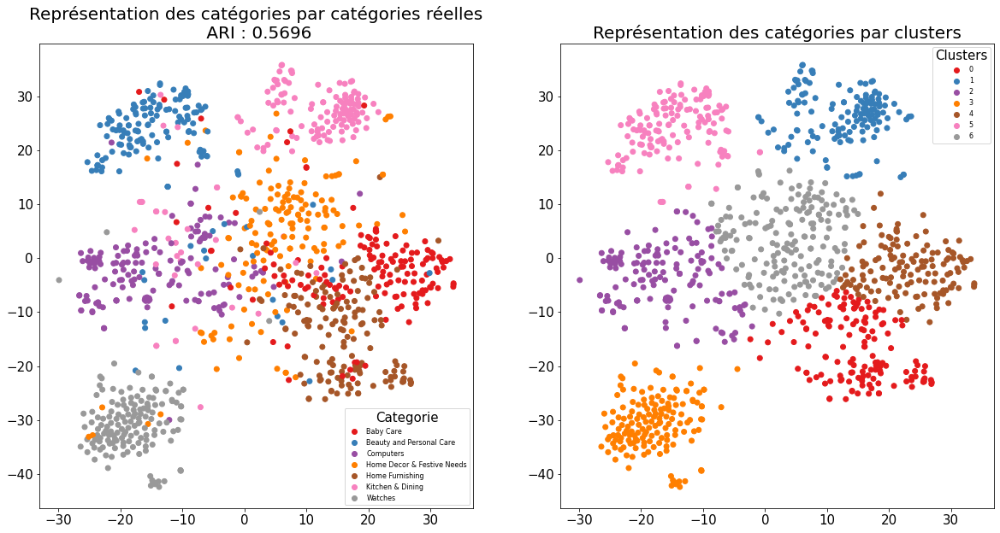

In [738]:
# Calcul des composantes TSNE

df_incep_vectors_tsne = tsne(df_incep_vectors, 40)

# kmeans

df_incep_vectors_tsnee_km, ARI, labels = kmeans(df_incep_vectors_tsne, df_categories)

# visualisation

TSNE_visu_fct(df_incep_vectors_tsnee_km, labels, ARI)
plt.savefig('IncepV3 vis tsne-kmeans',dpi=200, bbox_inches='tight')

,precision,recall,f1-score,support
0,0.751825,0.686667,0.717770,150.000000
1,0.874126,0.833333,0.853242,150.000000
2,0.760000,0.760000,0.760000,150.000000
3,0.535519,0.653333,0.588589,150.000000
4,0.797203,0.760000,0.778157,150.000000
5,0.847826,0.780000,0.812500,150.000000
6,0.935897,0.973333,0.954248,150.000000
accuracy,0.778095,0.778095,0.778095,0.778095
macro avg,0.786057,0.778095,0.780644,1050.000000
weighted avg,0.786057,0.778095,0.780644,1050.000000


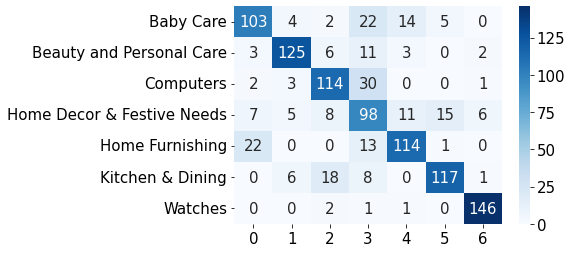

In [739]:
conf_mat_metrics(df_incep_vectors_tsnee_km)
plt.savefig('confusion matrix incep',dpi=200, bbox_inches='tight')
plt.show()

### Inceptionv3 est plus rapide que Vgg16 (2.3min contre 5min) et plus performant (ARI 0.569 contre 0.488) 

# <font color="blue" id="section_5"> 5 - Combinaison des meilleurs résultats des approches texte et image 

### tf-idf amélioré (description) et InceptionV3 : ARI 0.655 

-----------------------------------------
 coefficient de silhouette : 0.6869000196456909
 ARI  : 0.655
-----------------------------------------


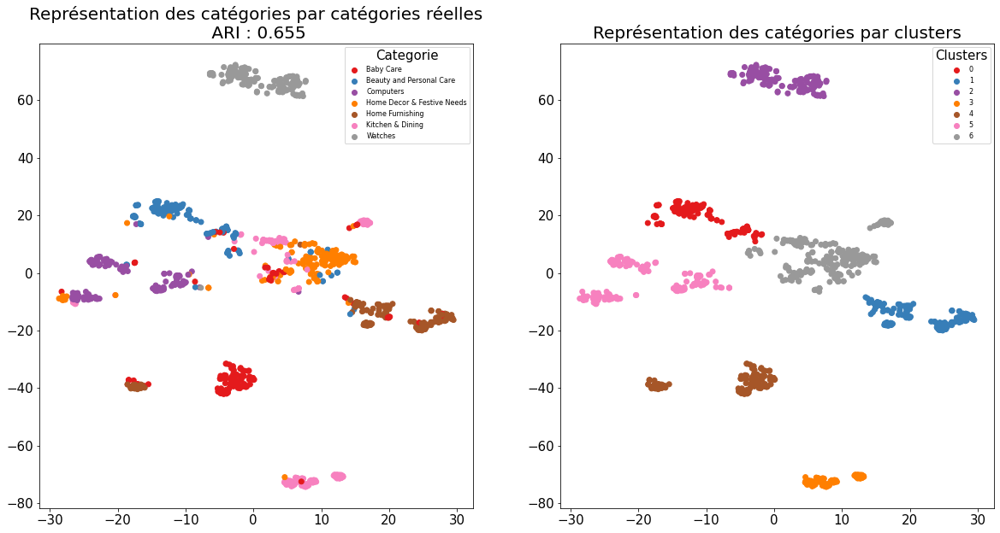

In [742]:
# Concaténation des matrices denses réduites des données textuelles et des images ARI 0.6334
# si jamais on n'a que la variable description et pas le nom du produit :

df_incep_vectors_tsne.rename(columns = {'DIM1':'VAR1', 'DIM2':'VAR2'}, inplace = True)
df_comb_incep_tfidf_desc = pd.concat([df_descc_tf_freq_tsne, df_incep_vectors_tsne],
                    axis=1) #, ignore_index=True)
 
# Calcul des composantes TSNE

df_comb_incep_tfidf_desc_tsne = tsne(df_comb_incep_tfidf_desc, 40)

# kmeans

df_comb_incep_tfidf_desc_tsne_km, ARI, labels = kmeans(df_comb_incep_tfidf_desc_tsne, df_categories)

# visualisation

TSNE_visu_fct(df_comb_incep_tfidf_desc_tsne_km, labels, ARI)
plt.savefig('Comb IncepV3 tfif desc',dpi=200, bbox_inches='tight')

,precision,recall,f1-score,support
0,0.844961,0.726667,0.781362,150.000000
1,0.919118,0.833333,0.874126,150.000000
2,0.821229,0.980000,0.893617,150.000000
3,0.557447,0.873333,0.680519,150.000000
4,0.883562,0.860000,0.871622,150.000000
5,0.973684,0.493333,0.654867,150.000000
6,1.000000,0.993333,0.996656,150.000000
accuracy,0.822857,0.822857,0.822857,0.822857
macro avg,0.857143,0.822857,0.821824,1050.000000
weighted avg,0.857143,0.822857,0.821824,1050.000000


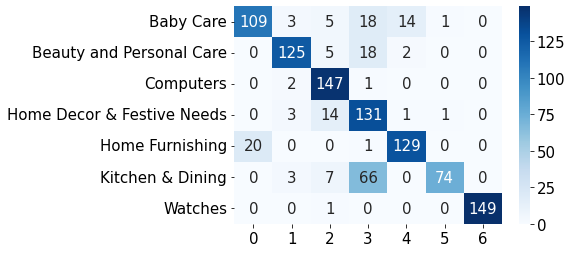

In [743]:
conf_mat_metrics(df_comb_incep_tfidf_desc_tsne_km)
plt.savefig('confusion matrix IncepV3 tfif desc',dpi=200, bbox_inches='tight')
plt.show()

### USE5 (product_name) et InceptionV3 : ARI 0.71 

-----------------------------------------
 coefficient de silhouette : 0.6937000155448914
 ARI  : 0.7107
-----------------------------------------


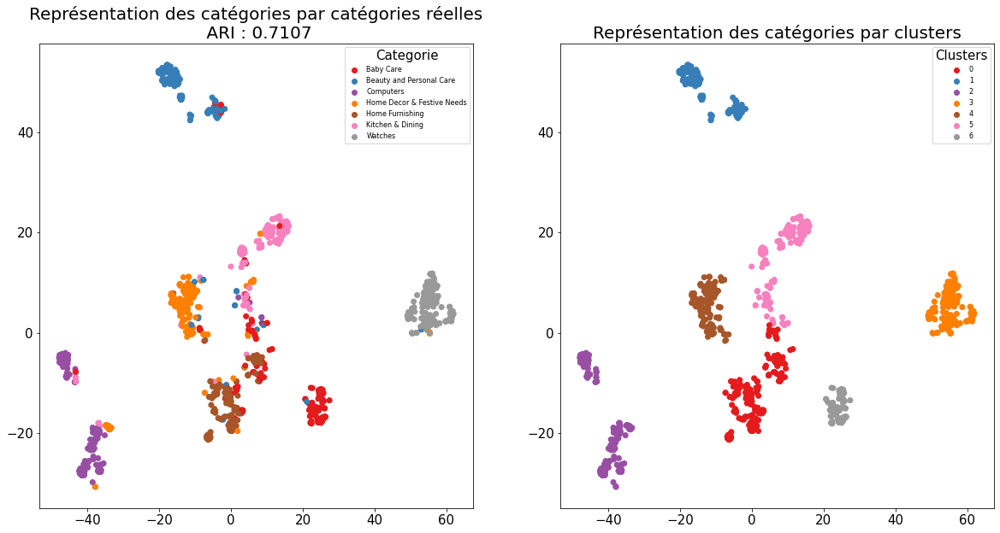

In [740]:
# Concaténation des matrices denses réduites des données textuelles et des images
df_incep_vectors_tsne.rename(columns = {'DIM1':'VAR1', 'DIM2':'VAR2'}, inplace = True)
df_comb_incep = pd.concat([df_USE_tsne_25, df_incep_vectors_tsne],
                    axis=1) #, ignore_index=True)

# Calcul des composantes TSNE

df_comb_incep_tsne = tsne(df_comb_incep, 40)

# kmeans

df_comb_incep_km, ARI, labels = kmeans(df_comb_incep_tsne, df_categories)

# visualisation

TSNE_visu_fct(df_comb_incep_km, labels, ARI)
plt.savefig('Comb IncepV3 use5 name',dpi=200, bbox_inches='tight')

,precision,recall,f1-score,support
0,0.987805,0.540000,0.698276,150.000000
1,0.977099,0.853333,0.911032,150.000000
2,0.848837,0.973333,0.906832,150.000000
3,0.871212,0.766667,0.815603,150.000000
4,0.694836,0.986667,0.815427,150.000000
5,0.806061,0.886667,0.844444,150.000000
6,0.967742,1.000000,0.983607,150.000000
accuracy,0.858095,0.858095,0.858095,0.858095
macro avg,0.879085,0.858095,0.853603,1050.000000
weighted avg,0.879085,0.858095,0.853603,1050.000000


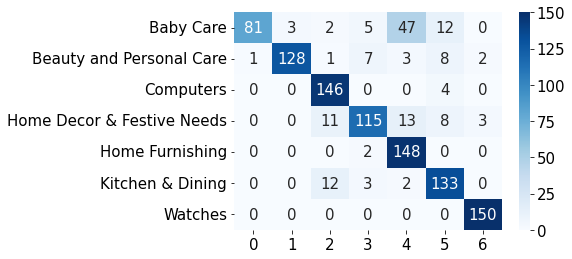

In [741]:
conf_mat_metrics(df_comb_incep_km)
plt.savefig('confusion matrix incep use5 name',dpi=200, bbox_inches='tight')
plt.show()

# <font color="blue" id="section_6"> 6- Conclusion

On a montré que la classification automatique est bien possible à partir des données textes et des données images (avec les réseaux de neurones) avec des bons résultats de classification. La combinaison des deux approches texte et image a donné une meilleure performance sur l'ensemble des classes (matrice de confusion) avec ARI = 71% et une accuracy de 85%. L'utilisation d'une classification supervisée permettra d'obtenir encore une meilleure performance